In [1]:
import os
import gc
import glob
import math
import random
import pickle
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm
from PIL import Image
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score, roc_curve, auc

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim.lr_scheduler import CosineAnnealingWarmRestarts
from torch.utils.data import DataLoader, Dataset, random_split
from torchvision import utils

import albumentations as A
from albumentations.pytorch import ToTensorV2

import sys
sys.path.append('../input/timm-pytorch-image-models/pytorch-image-models-master')
# sys.path.append('../input/rangerdeeplearningoptimizer/ranger')
import timm
import wandb
# from ranger import Ranger

np.random.seed(7)
torch.manual_seed(7)

device='cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [2]:
# class Mish_layer(nn.Module):
#     '''
#     The class defines the Mish activation function.
#     '''
#     def __init__(self):
#         super(Mish_layer,self).__init__()
#     def forward(self,x):
#         return x*torch.tanh(F.softplus(x))

In [3]:
def set_seed(seed):
    #Sets the seed for Reprocudibility
    random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        
set_seed(7)

In [4]:
from kaggle_secrets import UserSecretsClient

user_secrets = UserSecretsClient()
wandb_key = user_secrets.get_secret("wandb") 

wandb.login(key = wandb_key)

wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [5]:
config = dict(
    batch_size = 256,
    epochs = 300,
    learning_rate = 2e-3
    )

In [6]:
def img_paths_list(root_dir):
    root_list = glob.glob(root_dir)

    data = []
    for img_path in tqdm(root_list):
        data.append(img_path)
        
    return data

In [7]:
data_root_dir = r'../input/gsocml4scimodel3/Model_III/no_sub/*'
dataset_img_paths_list = img_paths_list(data_root_dir)

test_data_root_dir = r'../input/gsocml4scimodel3test/Model_III_test/no_sub/*'
test_paths_list = img_paths_list(test_data_root_dir)

# #this file was not being read by numpy
# dataset_img_paths_list.remove('../input/gsocml4scimodel8or9/reg_axion/sim_10205913971171895758427970222342137331.npy')

  0%|          | 0/30000 [00:00<?, ?it/s]

  0%|          | 0/5000 [00:00<?, ?it/s]

In [8]:
val_split = int(0.07 * len(dataset_img_paths_list))

random.shuffle(dataset_img_paths_list)

val_paths_list = dataset_img_paths_list[:val_split]
train_paths_list = dataset_img_paths_list[val_split:]

assert len(dataset_img_paths_list) == (len(train_paths_list) + len(val_paths_list))

len(train_paths_list), len(val_paths_list), len(test_paths_list)

(27900, 2100, 5000)

In [9]:
train_transforms = A.Compose(
            [
#                 A.CenterCrop(height = 50, width = 50, p = 1.0),
                A.HorizontalFlip(p = 0.5),
                A.VerticalFlip(p = 0.5),
                A.Rotate(limit = 360, p = 0.4),
                ToTensorV2()
            ]
        )


test_transforms = A.Compose(
            [
#                 A.CenterCrop(height = 50, width = 50, p = 1.0),
                ToTensorV2()
            ]
        )

In [10]:
def pickelize_file(dicto, pickle_path):
    file_to_write = open(pickle_path, "wb")
    pickle.dump(dicto, file_to_write)
    
    print("Pickleized successfully!")
    
pickelize_file(train_paths_list, "train_paths_list.pickle")
pickelize_file(val_paths_list, "val_paths_list.pickle")

Pickleized successfully!
Pickleized successfully!


In [11]:
class CustomDataset(Dataset):
    def __init__(self, paths_list, transform = None):

        self.transform = transform
        self.data = paths_list
            
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, idx):
        path = self.data[idx]
        img = np.load(path, allow_pickle = True)
        img = (img - np.min(img))/(np.max(img) - np.min(img))

       
        if self.transform:
            aug = self.transform(image = img)
            img = aug['image']
        
        img = img.to(torch.float)        

        return img

In [12]:
train_dataset = CustomDataset(train_paths_list, transform = train_transforms)
print(len(train_dataset))

val_dataset = CustomDataset(val_paths_list, transform = test_transforms)
print(len(val_dataset))

test_dataset = CustomDataset(test_paths_list, transform = test_transforms)
print(len(test_dataset))

27900
2100
5000


In [13]:
train_loader = DataLoader(train_dataset, batch_size = config['batch_size'], shuffle = True, num_workers = 2)
val_loader = DataLoader(val_dataset, batch_size = config['batch_size'], shuffle = False, num_workers = 2)
test_loader = DataLoader(test_dataset, batch_size = config['batch_size'], shuffle = False, num_workers = 2)

In [14]:
single_batch = next(iter(train_loader))
single_batch.shape

torch.Size([256, 1, 64, 64])

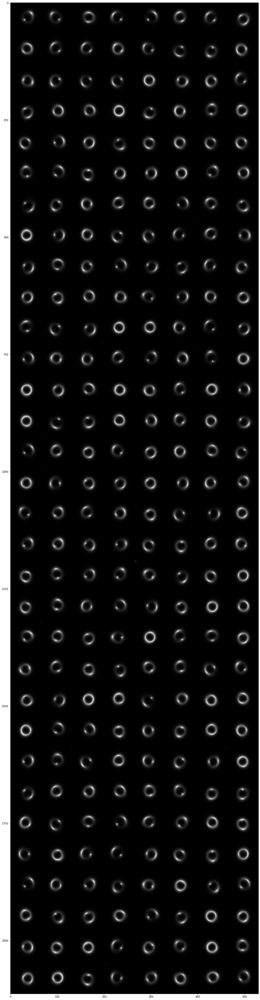

In [15]:
single_batch_grid = utils.make_grid(single_batch, nrow=8)
plt.figure(figsize = (20,70))
plt.imshow(single_batch_grid.permute(1, 2, 0))

In [16]:
class Encoder(nn.Module):
    
    def __init__(self, in_channels = 1, latent_dim = 2048):
        super().__init__()
        
        ### Convolutional section
        self.encoder_cnn = nn.Sequential(
            nn.Conv2d(in_channels = in_channels, out_channels = 16, kernel_size = 7, stride = 2, padding = 1),
            nn.BatchNorm2d(16),
            nn.PReLU(),

            nn.Conv2d(16, 32, 7, stride=2, padding = 1),
            nn.BatchNorm2d(32),
            nn.PReLU(),
            
            nn.Conv2d(32, 64, 7),
            nn.BatchNorm2d(64),
            nn.PReLU(),
            
#             nn.Conv2d(16, 8, 2, stride=1),
#             nn.BatchNorm2d(8),
#             nn.PReLU()
        )

        
        self.mu = nn.Linear(3136, latent_dim)
        self.var = nn.Linear(3136, latent_dim)
   
        
        
    def forward(self, x):
        x = self.encoder_cnn(x)
        x = x.view(x.shape[0],-1)

        z_mu = self.mu(x)
        z_var = self.var(x)

        return z_mu, z_var


In [17]:
class Decoder(nn.Module):
    
    def __init__(self, out_channels = 1, latent_dim = 2048):
        super().__init__()
        self.decoder_lin = nn.Sequential(
            nn.Linear(latent_dim, 3136),
            nn.PReLU()
        )
     
        self.decoder_conv = nn.Sequential(
            nn.ConvTranspose2d(64, 32, 7),
            nn.BatchNorm2d(32),
            nn.PReLU(),
            
            nn.ConvTranspose2d(32, 16, 7, stride = 2, padding = 1, output_padding = 1),
            nn.BatchNorm2d(16),
            nn.PReLU(),

            nn.ConvTranspose2d(16, out_channels, 7, stride = 2, padding = 1, output_padding = 1),
#             nn.BatchNorm2d(64),
#             nn.PReLU(),
            
#             nn.ConvTranspose2d(64, out_channels, 2, stride = 2),
# #             nn.UpsamplingBilinear2d(size=(256,256))
        )
        
    def forward(self, x):
        x = self.decoder_lin(x)
        x = x.view(x.shape[0], 64, 7, 7)
        x = self.decoder_conv(x)
#         x = torch.tanh(x)
        return x

In [18]:
class VAE(nn.Module):

    def __init__(self, enc, dec):
        super().__init__()

        self.enc = enc
        self.dec = dec

    def forward(self, x):
        
        z_mu, z_var = self.enc(x)
        std = torch.exp(z_var / 2)
        eps = torch.randn_like(std)
        x_sample = eps.mul(std).add_(z_mu)
        predicted = self.dec(x_sample)
        
        return predicted, z_mu, z_var


In [19]:
x = torch.randn(config["batch_size"], 1, 64, 64).to(device)
encoder = Encoder().to(device)
decoder = Decoder().to(device)
model = VAE(encoder, decoder).to(device)

pred, z_mu, z_var = model(x)
print(pred.shape, z_mu.shape, z_var.shape)



del encoder, decoder, model, x 
gc.collect()

torch.Size([256, 1, 64, 64]) torch.Size([256, 2048]) torch.Size([256, 2048])


209

In [20]:
def train_epoch(model, dataloader, criterion, optimizer, scheduler, example_ct):
    
    model.train()
    train_losses = []
    train_kld_losses = []

    loop=tqdm(enumerate(dataloader),total = len(dataloader))

    for batch_idx, img_batch in loop:

        X = img_batch.to(device)

        example_ct += len(img_batch)
        
        #forward prop
        y_pred, mu, var = model(X)
        
        #loss calculation
        loss = criterion(y_pred, X) 
        kld_loss = -0.5 * torch.sum(1 + var - mu.pow(2) - var.exp())
#         loss = ((y_pred - X)**2).sum() + model.encoder.kl

        #backprop
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        scheduler.step()

        #batch loss
        train_losses.append(loss.detach().cpu().numpy())
        train_kld_losses.append(kld_loss.detach().cpu().numpy())

    return model, np.mean(train_losses), np.mean(train_kld_losses), example_ct

In [21]:
def test_epoch(model, dataloader,criterion):

    model.eval()
    test_losses = []
    test_kld_losses = []
    
    y_pred_list = []
    y_truth_list = []

    with torch.no_grad():

        loop=tqdm(enumerate(dataloader),total=len(dataloader))
        
        for batch_idx, img_batch in loop:
            X = img_batch.to(device)
            y_truth_list.append(X.detach().cpu().numpy())

            #forward prop
            y_pred, mu, var = model(X)
            
            y_pred_list.append(y_pred.detach().cpu().numpy())

            #loss and accuracy calculation
            loss = criterion(y_pred, X) 
            kld_loss = -0.5 * torch.sum(1 + var - mu.pow(2) - var.exp())
#             loss = ((y_pred - X)**2).sum() + model.encoder.kl


            #batch loss and accuracy
            # print(f'Partial train loss: {loss.data}')
            test_losses.append(loss.detach().cpu().numpy())
            test_kld_losses.append(kld_loss.detach().cpu().numpy())

            
    return y_pred_list, y_truth_list, np.mean(test_losses), np.mean(test_kld_losses)

In [22]:
def plot_ae_outputs(model,dataset,epoch, n = 10):
    
    model.eval()
    plt.figure(figsize=(16,4.5))
    random_index = random.randint(0,len(dataset) - (n + 1)) 
    
    
    for i in range(n):
        ax = plt.subplot(2,n,i+1)
        img = dataset[random_index + i].unsqueeze(0).to(device)


        with torch.no_grad():
            rec_img, _, _ = model(img)
            
        img = img.permute(0,2,3,1)
        plt.imshow(img.cpu().squeeze().numpy(), cmap='gist_gray')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)  
        if i == n//2:
            ax.set_title('Original images')
            
        ax = plt.subplot(2, n, i + 1 + n)
        rec_img = rec_img.permute(0,2,3,1)
        plt.imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')  
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)  
        if i == n//2:
            ax.set_title('Reconstructed images')
            
    plot_name = f"Reconstructions"
    plt.savefig(plot_name, format="png", dpi=80)  
    pic = Image.open(plot_name)
    
    wandb.log({plot_name: [wandb.Image(pic, caption = f"Epoch : {epoch+1}")]})
            
    plt.show()   

In [23]:
def fit_model(model, config, checkpoint_path):
    
        # access all HPs through wandb.config, so logging matches execution!
        config = wandb.config

        EPOCHS = config.epochs
        LR = config.learning_rate
        optimizer = optim.Adam(model.parameters(), lr = LR)
#         optimizer = Ranger(model.parameters(), lr = LR)
#         scheduler = CosineAnnealingWarmRestarts(optimizer,T_0 = 10, T_mult = 1,eta_min = 1e-6, verbose=True)
        scheduler = optim.lr_scheduler.OneCycleLR(optimizer, LR, epochs = EPOCHS, steps_per_epoch = len(train_loader), verbose = False)
        criterion = nn.MSELoss()

        loss_dict = {'train_loss':[],'val_loss':[], 'train_kld_loss':[], 'val_kld_loss':[]}
        example_ct = 0  # number of examples seen
        min_val_loss = 999 #high value to initlialize

        wandb.watch(model, criterion, log="all", log_freq = 10)
        for epoch in range(EPOCHS):
            print(f"Epoch {epoch+1}/{EPOCHS}:")
            model, train_loss, train_kld_loss, example_ct = train_epoch(model, train_loader, criterion, optimizer, scheduler, example_ct)
            _, _, val_loss,test_kld_loss  = test_epoch(model, val_loader, criterion)
#             scheduler.step()

            print(f'Train loss: {train_loss}, Val loss: {val_loss}, \n Train KLD: {train_kld_loss}, Val KLD: {test_kld_loss}')
            
            if val_loss < min_val_loss:
                min_val_loss = val_loss
                print("New lower val loss. Saving model checkpoint!")
                torch.save(model.state_dict(), checkpoint_path)
    
            wandb.log({"epoch": epoch + 1, 
                       "train_loss":train_loss, "val_loss": val_loss,
                      "train_kld_loss" : train_kld_loss, "val_kld_loss": test_kld_loss
                      }, step = example_ct)

            loss_dict['train_loss'].append(train_loss)
            loss_dict['val_loss'].append(val_loss)
            
            loss_dict['train_kld_loss'].append(train_kld_loss)
            loss_dict['val_kld_loss'].append(test_kld_loss)

            if epoch % 5 == 0 or epoch + 1 == EPOCHS:
                plot_ae_outputs(model, val_dataset, epoch,10)


        return model, loss_dict

In [24]:
wandb.init(project="gsoc_model3-AD", config = config)

wandb: Currently logged in as: saranga7. Use `wandb login --relogin` to force relogin


In [25]:
encoder = Encoder().to(device)
decoder = Decoder().to(device)

model = VAE(encoder, decoder).to(device)

Epoch 1/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.0708223283290863, Val loss: 0.014766489155590534, 
 Train KLD: 1302834.75, Val KLD: 1669288.125
New lower val loss. Saving model checkpoint!


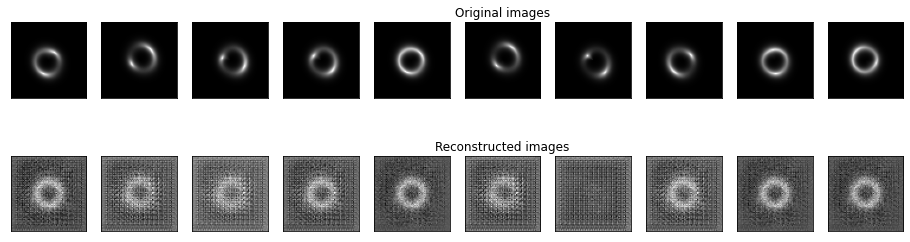

Epoch 2/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.010535428300499916, Val loss: 0.008375723846256733, 
 Train KLD: 1803402.125, Val KLD: 1524126.75
New lower val loss. Saving model checkpoint!
Epoch 3/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.006621838081628084, Val loss: 0.0054130759090185165, 
 Train KLD: 1729073.125, Val KLD: 1352794.5
New lower val loss. Saving model checkpoint!
Epoch 4/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.004491829313337803, Val loss: 0.003756724763661623, 
 Train KLD: 1529352.375, Val KLD: 1275650.625
New lower val loss. Saving model checkpoint!
Epoch 5/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.003241368103772402, Val loss: 0.0027736136689782143, 
 Train KLD: 1378099.375, Val KLD: 1193657.5
New lower val loss. Saving model checkpoint!
Epoch 6/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.002479629823938012, Val loss: 0.0021298350766301155, 
 Train KLD: 1306336.0, Val KLD: 1164677.5
New lower val loss. Saving model checkpoint!


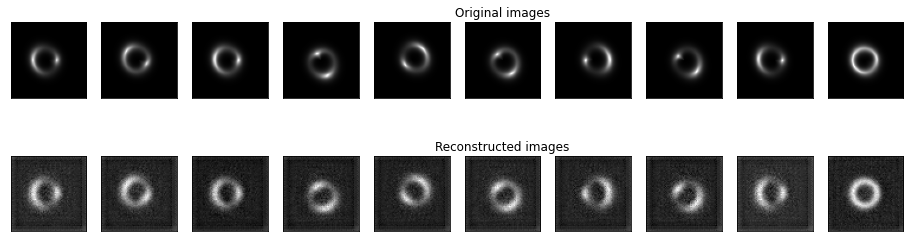

Epoch 7/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.0019497099565342069, Val loss: 0.001649926882237196, 
 Train KLD: 1260185.5, Val KLD: 1085882.5
New lower val loss. Saving model checkpoint!
Epoch 8/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.0015335788484662771, Val loss: 0.0013094592140987515, 
 Train KLD: 1225067.5, Val KLD: 1083190.375
New lower val loss. Saving model checkpoint!
Epoch 9/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.001228783163242042, Val loss: 0.0010887529933825135, 
 Train KLD: 1221916.125, Val KLD: 1095121.25
New lower val loss. Saving model checkpoint!
Epoch 10/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.0009873317321762443, Val loss: 0.0008242690237239003, 
 Train KLD: 1243703.5, Val KLD: 1155805.625
New lower val loss. Saving model checkpoint!
Epoch 11/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.0008212948450818658, Val loss: 0.0006931305397301912, 
 Train KLD: 1286064.75, Val KLD: 1201394.5
New lower val loss. Saving model checkpoint!


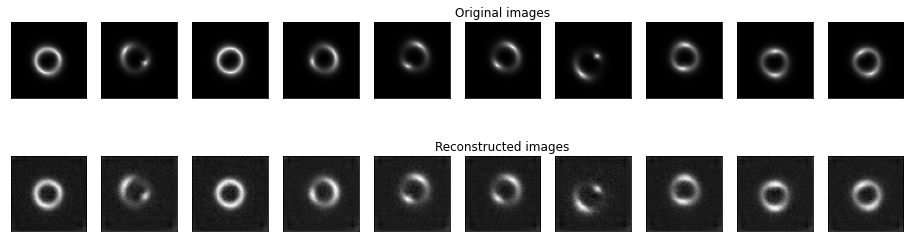

Epoch 12/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.0006910201627761126, Val loss: 0.0006146053201518953, 
 Train KLD: 1331694.625, Val KLD: 1243727.625
New lower val loss. Saving model checkpoint!
Epoch 13/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.0005826032138429582, Val loss: 0.00048805741243995726, 
 Train KLD: 1377058.25, Val KLD: 1291481.75
New lower val loss. Saving model checkpoint!
Epoch 14/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.000518937362357974, Val loss: 0.0004472973523661494, 
 Train KLD: 1423499.75, Val KLD: 1322141.0
New lower val loss. Saving model checkpoint!
Epoch 15/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.0004563078691717237, Val loss: 0.00039078487316146493, 
 Train KLD: 1455865.75, Val KLD: 1359338.875
New lower val loss. Saving model checkpoint!
Epoch 16/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.0004278944688849151, Val loss: 0.0003568728861864656, 
 Train KLD: 1480027.25, Val KLD: 1390201.25
New lower val loss. Saving model checkpoint!


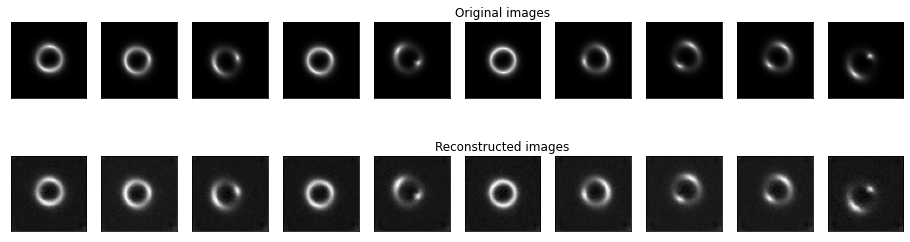

Epoch 17/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.0003514945274218917, Val loss: 0.0003277694631833583, 
 Train KLD: 1504224.75, Val KLD: 1409357.625
New lower val loss. Saving model checkpoint!
Epoch 18/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.0003257554490119219, Val loss: 0.0004412198031786829, 
 Train KLD: 1531667.875, Val KLD: 1431931.875
Epoch 19/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.000308154005324468, Val loss: 0.0002579067659098655, 
 Train KLD: 1548843.75, Val KLD: 1464529.5
New lower val loss. Saving model checkpoint!
Epoch 20/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.0002747359685599804, Val loss: 0.00022061342315282673, 
 Train KLD: 1561468.75, Val KLD: 1456315.5
New lower val loss. Saving model checkpoint!
Epoch 21/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.0002378915814915672, Val loss: 0.00021842292335350066, 
 Train KLD: 1592814.0, Val KLD: 1465181.75
New lower val loss. Saving model checkpoint!


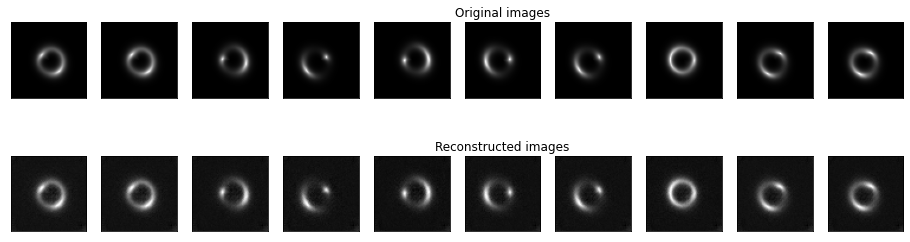

Epoch 22/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.00022072008869145066, Val loss: 0.0002184550539823249, 
 Train KLD: 1617796.875, Val KLD: 1468290.625
Epoch 23/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.00020325979858171195, Val loss: 0.00016405123460572213, 
 Train KLD: 1645868.375, Val KLD: 1528093.375
New lower val loss. Saving model checkpoint!
Epoch 24/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.0002414062328170985, Val loss: 0.0002167202183045447, 
 Train KLD: 1652546.625, Val KLD: 1465056.625
Epoch 25/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.00017589496565051377, Val loss: 0.00025356520200148225, 
 Train KLD: 1664349.25, Val KLD: 1528771.75
Epoch 26/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.00018902610463555902, Val loss: 0.00017780871712602675, 
 Train KLD: 1686473.125, Val KLD: 1559920.375


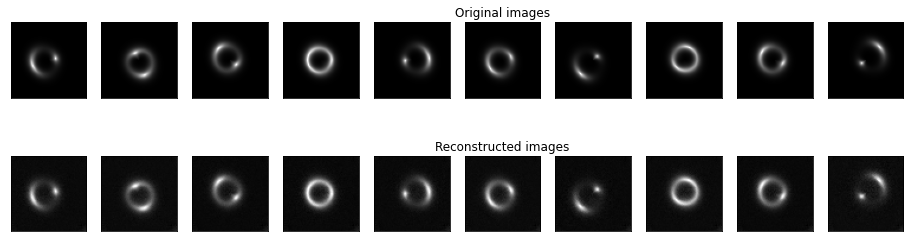

Epoch 27/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.00018457675469107926, Val loss: 0.00018485139298718423, 
 Train KLD: 1709807.75, Val KLD: 1553414.75
Epoch 28/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.00016028620302677155, Val loss: 0.00015660969074815512, 
 Train KLD: 1729270.5, Val KLD: 1602408.5
New lower val loss. Saving model checkpoint!
Epoch 29/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.00014586687029805034, Val loss: 9.888557542581111e-05, 
 Train KLD: 1741438.5, Val KLD: 1621696.0
New lower val loss. Saving model checkpoint!
Epoch 30/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.00013755305553786457, Val loss: 0.00018835373339243233, 
 Train KLD: 1779156.5, Val KLD: 1652932.625
Epoch 31/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.00013517195475287735, Val loss: 9.806395246414468e-05, 
 Train KLD: 1798497.375, Val KLD: 1665188.125
New lower val loss. Saving model checkpoint!


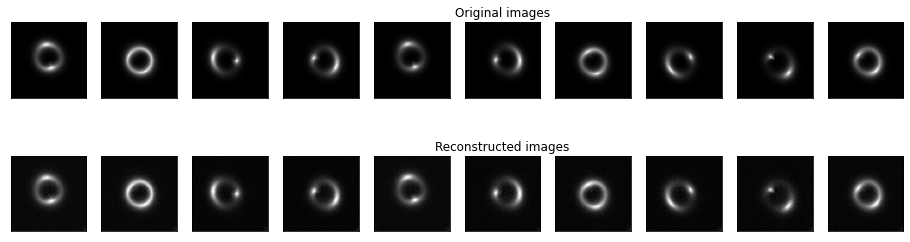

Epoch 32/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.00013591389870271087, Val loss: 0.00016291959036607295, 
 Train KLD: 1804773.125, Val KLD: 1681049.75
Epoch 33/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.00011325779632898048, Val loss: 9.718621731735766e-05, 
 Train KLD: 1834946.25, Val KLD: 1647747.375
New lower val loss. Saving model checkpoint!
Epoch 34/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.00012118665472371504, Val loss: 0.000122847588500008, 
 Train KLD: 1857638.125, Val KLD: 1703969.25
Epoch 35/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.00010983886750182137, Val loss: 0.00010057887266157195, 
 Train KLD: 1862315.25, Val KLD: 1704619.0
Epoch 36/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.00012064162001479417, Val loss: 0.0001279089046875015, 
 Train KLD: 1874650.125, Val KLD: 1749687.25


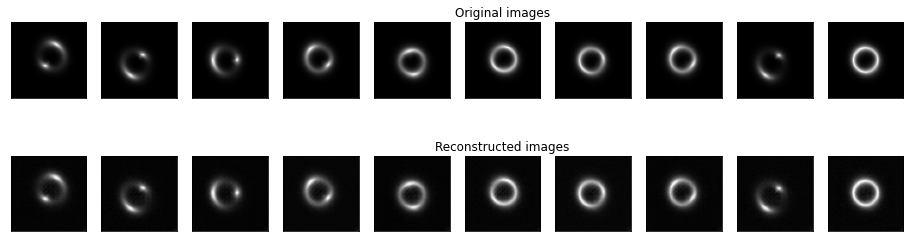

Epoch 37/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.0001273934612981975, Val loss: 6.921905878698453e-05, 
 Train KLD: 1877953.375, Val KLD: 1753874.125
New lower val loss. Saving model checkpoint!
Epoch 38/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.00010159327939618379, Val loss: 0.00011204369366168976, 
 Train KLD: 1897831.75, Val KLD: 1773122.375
Epoch 39/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.00011317143071210012, Val loss: 0.00010657046368578449, 
 Train KLD: 1899030.75, Val KLD: 1781740.75
Epoch 40/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.00010347423813072965, Val loss: 7.755623664706945e-05, 
 Train KLD: 1908779.75, Val KLD: 1772938.5
Epoch 41/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.00010091315925819799, Val loss: 0.00014568564074579626, 
 Train KLD: 1917909.625, Val KLD: 1729576.0


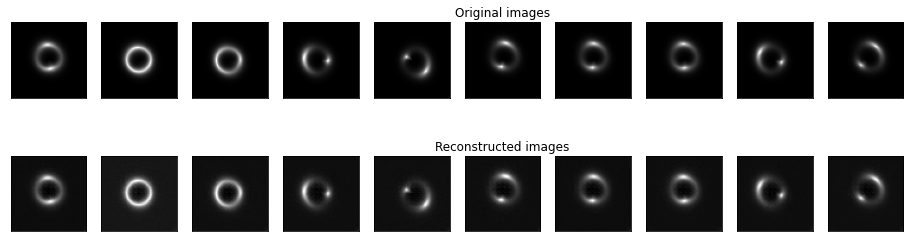

Epoch 42/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.00010866519005503505, Val loss: 0.00022533575247507542, 
 Train KLD: 1931682.875, Val KLD: 1760397.625
Epoch 43/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 8.857205102685839e-05, Val loss: 7.001290941843763e-05, 
 Train KLD: 1942222.625, Val KLD: 1842531.625
Epoch 44/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 9.16963181225583e-05, Val loss: 9.319530363427475e-05, 
 Train KLD: 1951169.5, Val KLD: 1800872.125
Epoch 45/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.0001067003613570705, Val loss: 0.00014181404549162835, 
 Train KLD: 1964871.625, Val KLD: 1800258.0
Epoch 46/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.00010964405373670161, Val loss: 8.057689410634339e-05, 
 Train KLD: 1971773.375, Val KLD: 1821612.5


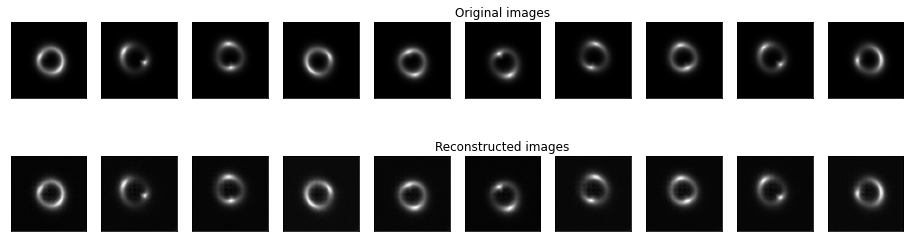

Epoch 47/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 8.118524419842288e-05, Val loss: 0.00010117900819750503, 
 Train KLD: 1978638.375, Val KLD: 1816766.0
Epoch 48/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.00010270768689224496, Val loss: 7.506494148401543e-05, 
 Train KLD: 2003111.75, Val KLD: 1856430.875
Epoch 49/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 8.863177208695561e-05, Val loss: 7.514085882576182e-05, 
 Train KLD: 2032955.5, Val KLD: 1900927.5
Epoch 50/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 7.072520384099334e-05, Val loss: 8.416618220508099e-05, 
 Train KLD: 2047965.25, Val KLD: 1866727.125
Epoch 51/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 0.00010421331535326317, Val loss: 0.00016978962230496109, 
 Train KLD: 2048703.125, Val KLD: 1873410.25


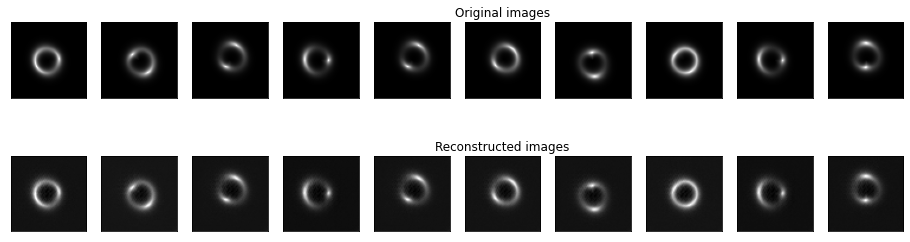

Epoch 52/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 8.679187158122659e-05, Val loss: 8.648746006656438e-05, 
 Train KLD: 2069147.625, Val KLD: 1962992.0
Epoch 53/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 6.587956886505708e-05, Val loss: 6.732822657795623e-05, 
 Train KLD: 2092577.125, Val KLD: 1944305.375
New lower val loss. Saving model checkpoint!
Epoch 54/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 7.846209337003529e-05, Val loss: 8.194865949917585e-05, 
 Train KLD: 2109554.5, Val KLD: 1943215.75
Epoch 55/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 7.793645636411384e-05, Val loss: 3.4603563108248636e-05, 
 Train KLD: 2135103.75, Val KLD: 1974348.875
New lower val loss. Saving model checkpoint!
Epoch 56/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 7.98159308033064e-05, Val loss: 8.171084482455626e-05, 
 Train KLD: 2152391.0, Val KLD: 1993550.5


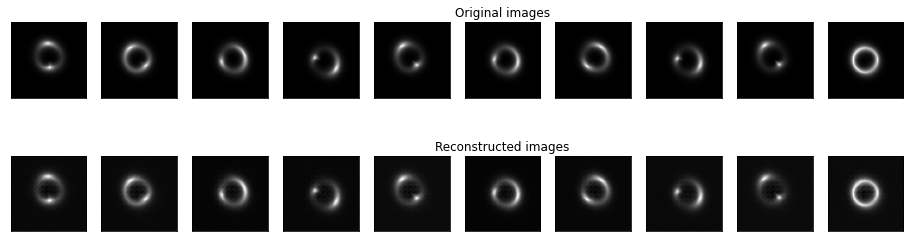

Epoch 57/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 8.004490518942475e-05, Val loss: 5.55805308977142e-05, 
 Train KLD: 2173770.25, Val KLD: 2052651.125
Epoch 58/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 8.439650991931558e-05, Val loss: 3.8774716813350096e-05, 
 Train KLD: 2218526.25, Val KLD: 2052608.875
Epoch 59/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 7.71496634115465e-05, Val loss: 7.459730113623664e-05, 
 Train KLD: 2238210.75, Val KLD: 2064527.125
Epoch 60/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 6.945615314180031e-05, Val loss: 4.34411849710159e-05, 
 Train KLD: 2255401.25, Val KLD: 2112786.0
Epoch 61/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 6.9236739363987e-05, Val loss: 8.674777200212702e-05, 
 Train KLD: 2279511.5, Val KLD: 2128209.25


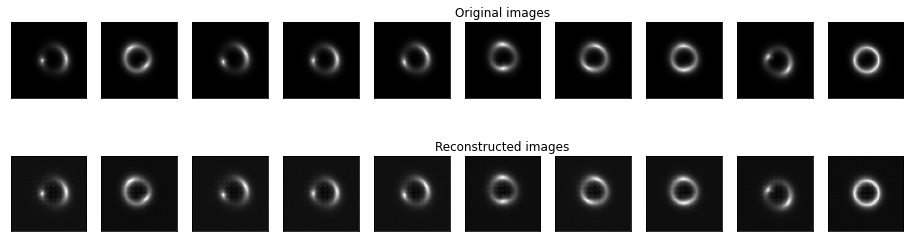

Epoch 62/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 7.045184611342847e-05, Val loss: 0.00013964337995275855, 
 Train KLD: 2304026.5, Val KLD: 2202981.0
Epoch 63/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 8.306671952595934e-05, Val loss: 6.403875886462629e-05, 
 Train KLD: 2344411.0, Val KLD: 2143819.0
Epoch 64/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 6.643259985139593e-05, Val loss: 3.3689644624246284e-05, 
 Train KLD: 2370310.5, Val KLD: 2211139.25
New lower val loss. Saving model checkpoint!
Epoch 65/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 6.0118276451248676e-05, Val loss: 3.6815406929235905e-05, 
 Train KLD: 2384680.0, Val KLD: 2188873.75
Epoch 66/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 6.371366907842457e-05, Val loss: 6.244845280889422e-05, 
 Train KLD: 2402104.25, Val KLD: 2217734.25


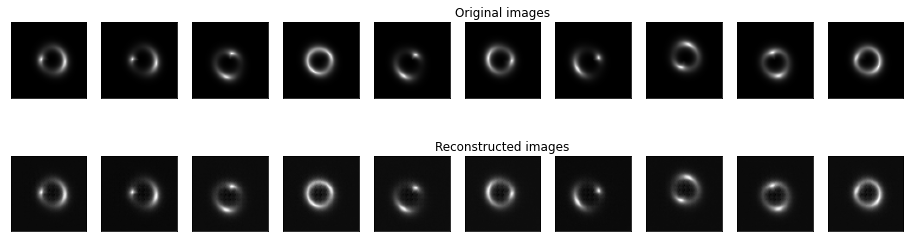

Epoch 67/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 6.356794619932771e-05, Val loss: 6.586118252016604e-05, 
 Train KLD: 2423356.0, Val KLD: 2224054.25
Epoch 68/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 5.705258445232175e-05, Val loss: 7.970566366566345e-05, 
 Train KLD: 2470019.25, Val KLD: 2318593.25
Epoch 69/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 6.386562017723918e-05, Val loss: 7.392895349767059e-05, 
 Train KLD: 2500709.75, Val KLD: 2360881.0
Epoch 70/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 5.776385296485387e-05, Val loss: 6.24354142928496e-05, 
 Train KLD: 2541898.0, Val KLD: 2324409.0
Epoch 71/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 6.052972094039433e-05, Val loss: 3.1062001653481275e-05, 
 Train KLD: 2579653.75, Val KLD: 2373478.75
New lower val loss. Saving model checkpoint!


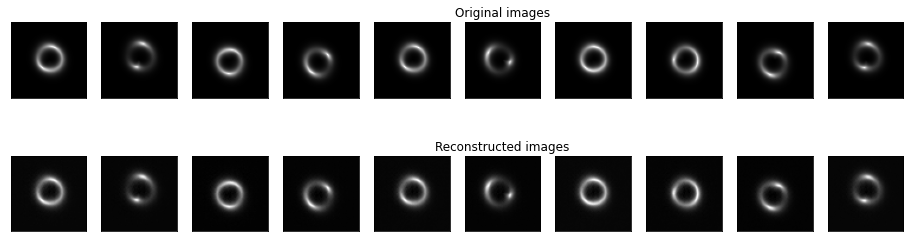

Epoch 72/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 6.019667853252031e-05, Val loss: 5.7100292906397954e-05, 
 Train KLD: 2622032.25, Val KLD: 2470091.75
Epoch 73/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 6.171463610371575e-05, Val loss: 4.364231426734477e-05, 
 Train KLD: 2663037.25, Val KLD: 2529667.0
Epoch 74/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 4.762517346534878e-05, Val loss: 7.167919829953462e-05, 
 Train KLD: 2690158.0, Val KLD: 2483368.75
Epoch 75/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 5.456731378217228e-05, Val loss: 5.940885966992937e-05, 
 Train KLD: 2722295.0, Val KLD: 2534629.25
Epoch 76/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 4.696345786214806e-05, Val loss: 5.442475958261639e-05, 
 Train KLD: 2761078.5, Val KLD: 2559496.5


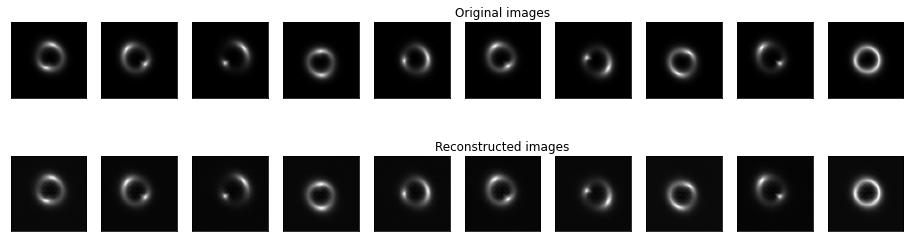

Epoch 77/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 5.479628453031182e-05, Val loss: 4.989935769117437e-05, 
 Train KLD: 2801052.5, Val KLD: 2622255.5
Epoch 78/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 5.059457180323079e-05, Val loss: 3.428174022701569e-05, 
 Train KLD: 2857296.75, Val KLD: 2754921.5
Epoch 79/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 4.4648095354205e-05, Val loss: 6.515613495139405e-05, 
 Train KLD: 2894604.25, Val KLD: 2686756.0
Epoch 80/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 4.651095514418557e-05, Val loss: 2.6312969566788524e-05, 
 Train KLD: 2922511.25, Val KLD: 2684788.75
New lower val loss. Saving model checkpoint!
Epoch 81/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 4.629308750736527e-05, Val loss: 6.840640708105639e-05, 
 Train KLD: 2938540.5, Val KLD: 2832583.0


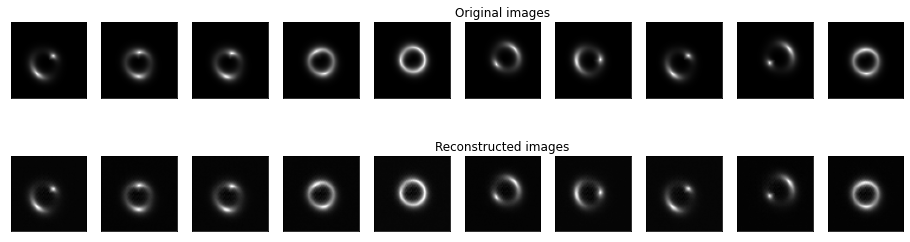

Epoch 82/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 4.528915451373905e-05, Val loss: 3.2441246730741113e-05, 
 Train KLD: 2995433.75, Val KLD: 2769809.25
Epoch 83/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 4.2936764657497406e-05, Val loss: 4.605257709044963e-05, 
 Train KLD: 3031410.5, Val KLD: 2824043.5
Epoch 84/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 5.290332774166018e-05, Val loss: 4.005358641734347e-05, 
 Train KLD: 3090583.5, Val KLD: 2817924.5
Epoch 85/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.950225800508633e-05, Val loss: 3.236973861930892e-05, 
 Train KLD: 3125268.25, Val KLD: 2864601.0
Epoch 86/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 4.058841659571044e-05, Val loss: 3.4854383557103574e-05, 
 Train KLD: 3155183.0, Val KLD: 2979499.5


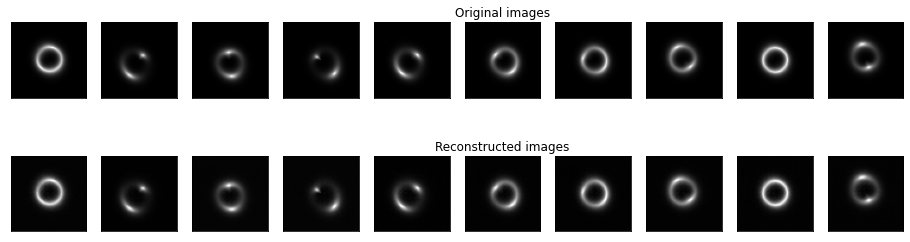

Epoch 87/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.769795875996351e-05, Val loss: 3.754391218535602e-05, 
 Train KLD: 3196600.25, Val KLD: 2984364.0
Epoch 88/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.7624151445925236e-05, Val loss: 4.6053359255893156e-05, 
 Train KLD: 3233549.25, Val KLD: 3006712.75
Epoch 89/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.60550511686597e-05, Val loss: 3.567519161151722e-05, 
 Train KLD: 3270289.5, Val KLD: 2988622.5
Epoch 90/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.264236875111237e-05, Val loss: 3.620939969550818e-05, 
 Train KLD: 3308783.5, Val KLD: 3024956.0
Epoch 91/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.370506237843074e-05, Val loss: 2.774115273496136e-05, 
 Train KLD: 3328735.75, Val KLD: 3097098.25


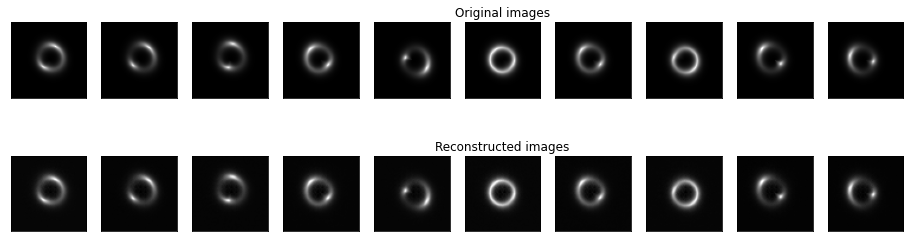

Epoch 92/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.40572623827029e-05, Val loss: 4.8889414756558836e-05, 
 Train KLD: 3355961.25, Val KLD: 3102565.0
Epoch 93/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.524139174260199e-05, Val loss: 2.4046545149758458e-05, 
 Train KLD: 3411102.5, Val KLD: 3176120.0
New lower val loss. Saving model checkpoint!
Epoch 94/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.5700704756891355e-05, Val loss: 3.941668910556473e-05, 
 Train KLD: 3453066.0, Val KLD: 3216336.25
Epoch 95/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 2.8165433832327835e-05, Val loss: 1.73151092894841e-05, 
 Train KLD: 3462591.75, Val KLD: 3251835.0
New lower val loss. Saving model checkpoint!
Epoch 96/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.1374653190141544e-05, Val loss: 1.983170659514144e-05, 
 Train KLD: 3495393.75, Val KLD: 3233895.0


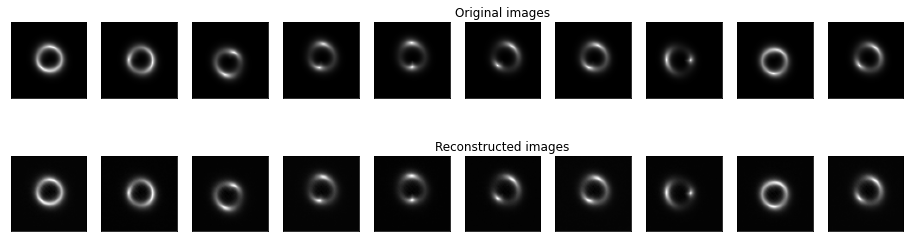

Epoch 97/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 2.9820186682627536e-05, Val loss: 6.474060501204804e-05, 
 Train KLD: 3526430.0, Val KLD: 3269039.25
Epoch 98/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 2.5894258214975707e-05, Val loss: 1.4938732419977896e-05, 
 Train KLD: 3561091.0, Val KLD: 3280027.25
New lower val loss. Saving model checkpoint!
Epoch 99/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 2.5926847229129635e-05, Val loss: 2.3311244149226695e-05, 
 Train KLD: 3567659.5, Val KLD: 3263537.0
Epoch 100/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.119398752460256e-05, Val loss: 2.3616274120286107e-05, 
 Train KLD: 3608828.0, Val KLD: 3365058.0
Epoch 101/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 2.7642185159493238e-05, Val loss: 2.1652691430062987e-05, 
 Train KLD: 3663416.0, Val KLD: 3385976.25


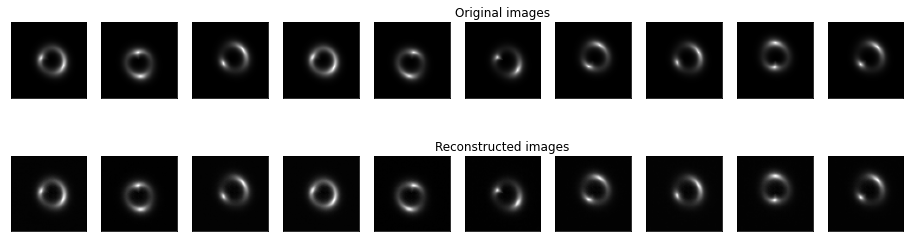

Epoch 102/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 2.448769191687461e-05, Val loss: 2.0459450752241537e-05, 
 Train KLD: 3687488.5, Val KLD: 3395103.0
Epoch 103/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 2.733797373366542e-05, Val loss: 1.3856543773727026e-05, 
 Train KLD: 3713204.0, Val KLD: 3431408.0
New lower val loss. Saving model checkpoint!
Epoch 104/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 2.282504465256352e-05, Val loss: 2.9750563044217415e-05, 
 Train KLD: 3742826.25, Val KLD: 3386175.0
Epoch 105/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 2.3810840502846986e-05, Val loss: 1.9397140931687318e-05, 
 Train KLD: 3754823.75, Val KLD: 3440709.75
Epoch 106/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 2.5499830371700227e-05, Val loss: 4.971874295733869e-05, 
 Train KLD: 3768309.5, Val KLD: 3502000.5


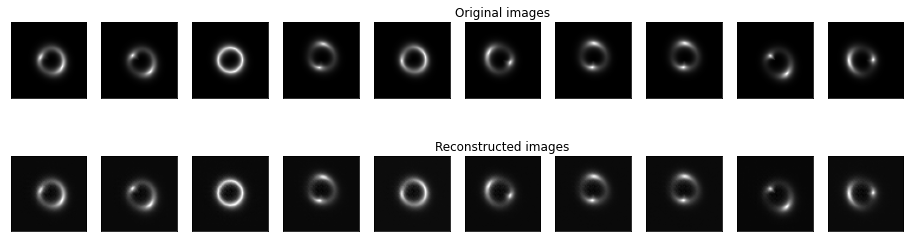

Epoch 107/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 2.821299131028354e-05, Val loss: 1.896658977784682e-05, 
 Train KLD: 3815903.5, Val KLD: 3566388.25
Epoch 108/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 2.3439133656211197e-05, Val loss: 2.7269574275123887e-05, 
 Train KLD: 3862266.75, Val KLD: 3561997.0
Epoch 109/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 2.363956991757732e-05, Val loss: 2.3210763174574822e-05, 
 Train KLD: 3867349.5, Val KLD: 3546184.75
Epoch 110/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 2.0532885173452087e-05, Val loss: 2.1941248633083887e-05, 
 Train KLD: 3877975.5, Val KLD: 3583551.5
Epoch 111/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 2.2492789867101237e-05, Val loss: 1.974600672838278e-05, 
 Train KLD: 3926860.25, Val KLD: 3666511.5


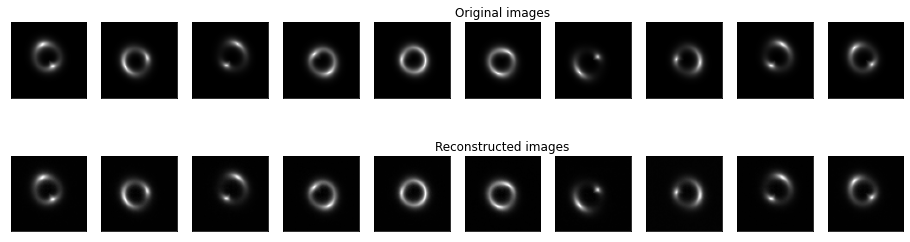

Epoch 112/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 2.9911614547017962e-05, Val loss: 2.956230309791863e-05, 
 Train KLD: 3969387.5, Val KLD: 3763029.75
Epoch 113/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 2.119046803272795e-05, Val loss: 1.5004107808636036e-05, 
 Train KLD: 4014288.25, Val KLD: 3672199.0
Epoch 114/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.8499482393963262e-05, Val loss: 2.6029161745100282e-05, 
 Train KLD: 4019865.5, Val KLD: 3675425.5
Epoch 115/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.978056570806075e-05, Val loss: 1.6550264263059944e-05, 
 Train KLD: 4047621.75, Val KLD: 3756447.0
Epoch 116/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.9769084246945567e-05, Val loss: 1.2008121302642394e-05, 
 Train KLD: 4057838.75, Val KLD: 3747153.25
New lower val loss. Saving model checkpoint!


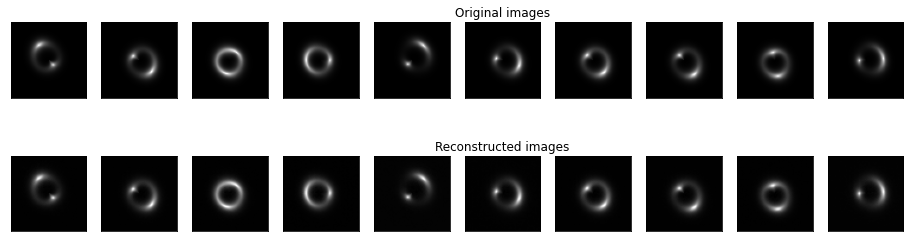

Epoch 117/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.9257271560491063e-05, Val loss: 3.126054798485711e-05, 
 Train KLD: 4076009.5, Val KLD: 3822155.0
Epoch 118/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 2.0737406885018572e-05, Val loss: 2.1004194422857836e-05, 
 Train KLD: 4116180.75, Val KLD: 3822949.75
Epoch 119/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 2.1445091988425702e-05, Val loss: 1.66624322446296e-05, 
 Train KLD: 4130203.0, Val KLD: 3831267.5
Epoch 120/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 2.6802112188306637e-05, Val loss: 1.9324332242831588e-05, 
 Train KLD: 4210868.5, Val KLD: 3917156.0
Epoch 121/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.6226747902692296e-05, Val loss: 1.6080222849268466e-05, 
 Train KLD: 4234731.5, Val KLD: 3937325.0


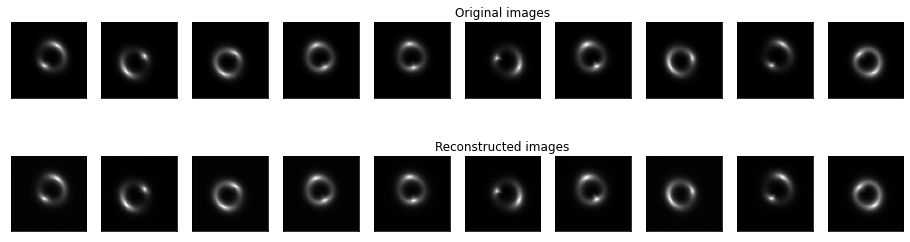

Epoch 122/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.4806730177951977e-05, Val loss: 1.8119475498679094e-05, 
 Train KLD: 4236593.0, Val KLD: 3872101.0
Epoch 123/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.8162983906222507e-05, Val loss: 2.042406049440615e-05, 
 Train KLD: 4246165.5, Val KLD: 3941593.25
Epoch 124/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.920432441693265e-05, Val loss: 1.9341161532793194e-05, 
 Train KLD: 4264536.5, Val KLD: 3924800.0
Epoch 125/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.6151165254996158e-05, Val loss: 1.0137764547835104e-05, 
 Train KLD: 4277735.5, Val KLD: 3953374.75
New lower val loss. Saving model checkpoint!
Epoch 126/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.4006832316226792e-05, Val loss: 9.942376891558524e-06, 
 Train KLD: 4295658.0, Val KLD: 3959637.0
New lower val loss. Saving model checkpoint!


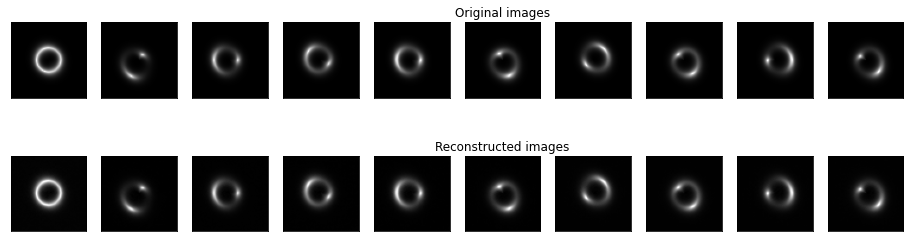

Epoch 127/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.485861594119342e-05, Val loss: 1.6428459275630303e-05, 
 Train KLD: 4305017.5, Val KLD: 4015002.75
Epoch 128/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 2.0914620108669624e-05, Val loss: 1.3989695617055986e-05, 
 Train KLD: 4332964.5, Val KLD: 4000030.75
Epoch 129/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.499339396104915e-05, Val loss: 1.1093866305600386e-05, 
 Train KLD: 4367663.5, Val KLD: 3986654.75
Epoch 130/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.5762618204462342e-05, Val loss: 1.5340578102041036e-05, 
 Train KLD: 4390605.5, Val KLD: 4162968.0
Epoch 131/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.7061747712432407e-05, Val loss: 1.138695006375201e-05, 
 Train KLD: 4418666.5, Val KLD: 4023815.5


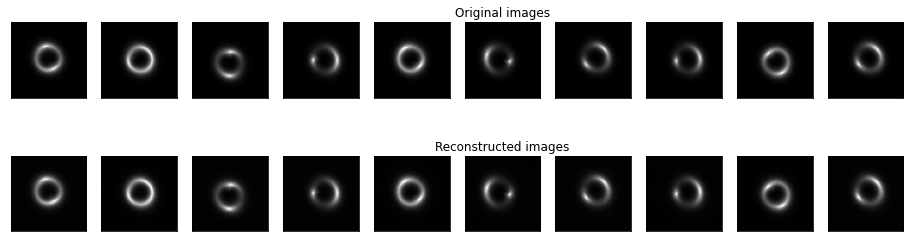

Epoch 132/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.6914027582970448e-05, Val loss: 1.3873843272449449e-05, 
 Train KLD: 4424171.0, Val KLD: 4053538.25
Epoch 133/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.4017985449754633e-05, Val loss: 9.270476766687352e-06, 
 Train KLD: 4434992.0, Val KLD: 4079185.75
New lower val loss. Saving model checkpoint!
Epoch 134/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 2.1513511455850676e-05, Val loss: 4.330926822149195e-05, 
 Train KLD: 4457670.0, Val KLD: 4039192.0
Epoch 135/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.5831717973924242e-05, Val loss: 3.3015508961398154e-05, 
 Train KLD: 4522960.0, Val KLD: 4131221.25
Epoch 136/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 2.1001553250243887e-05, Val loss: 1.6993908502627164e-05, 
 Train KLD: 4559305.0, Val KLD: 4262658.0


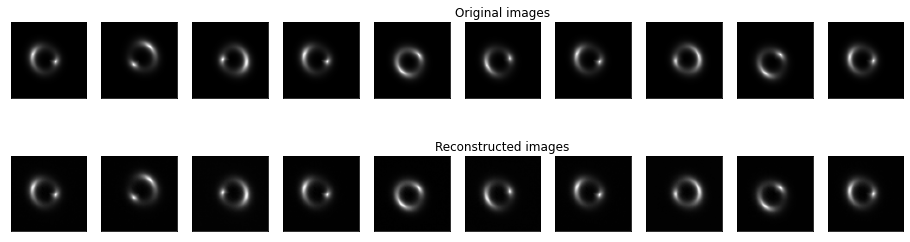

Epoch 137/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.608183629286941e-05, Val loss: 1.857806637417525e-05, 
 Train KLD: 4582546.0, Val KLD: 4227714.0
Epoch 138/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.5733898180769756e-05, Val loss: 1.6170029994100332e-05, 
 Train KLD: 4599391.5, Val KLD: 4244922.5
Epoch 139/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.2185377272544429e-05, Val loss: 8.832113053358626e-06, 
 Train KLD: 4620514.0, Val KLD: 4251997.5
New lower val loss. Saving model checkpoint!
Epoch 140/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.3066488463664427e-05, Val loss: 1.1159013411088381e-05, 
 Train KLD: 4610977.5, Val KLD: 4247765.0
Epoch 141/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.2605138181243092e-05, Val loss: 9.811709787754808e-06, 
 Train KLD: 4619430.0, Val KLD: 4230106.0


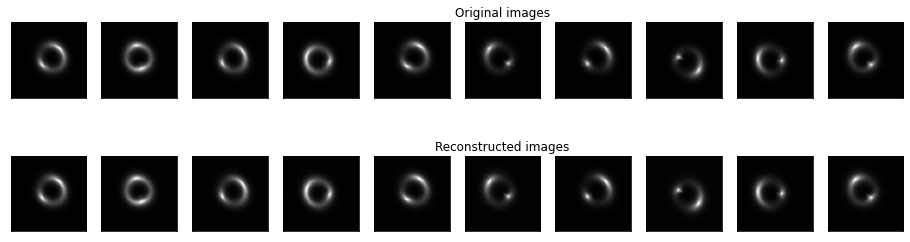

Epoch 142/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.112577137973858e-05, Val loss: 9.703282557893544e-06, 
 Train KLD: 4629091.0, Val KLD: 4234721.0
Epoch 143/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.5507228454225697e-05, Val loss: 9.136488188232761e-06, 
 Train KLD: 4650259.0, Val KLD: 4306717.5
Epoch 144/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.2999043974559754e-05, Val loss: 9.819886145123746e-06, 
 Train KLD: 4658114.0, Val KLD: 4270681.5
Epoch 145/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.1343286132614594e-05, Val loss: 1.0885085430345498e-05, 
 Train KLD: 4674593.5, Val KLD: 4287966.0
Epoch 146/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.0131157978321426e-05, Val loss: 7.116664164641406e-06, 
 Train KLD: 4674816.0, Val KLD: 4301196.0
New lower val loss. Saving model checkpoint!


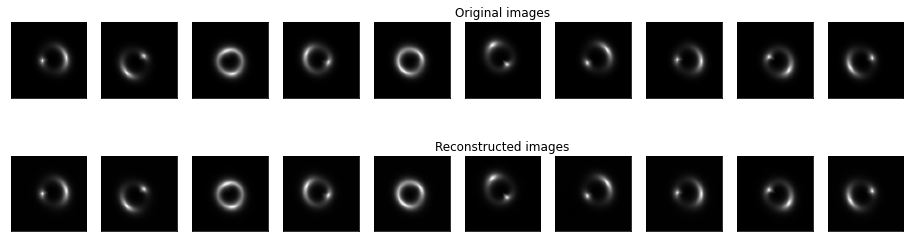

Epoch 147/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.1323693797749002e-05, Val loss: 1.1808859198936261e-05, 
 Train KLD: 4686636.0, Val KLD: 4315291.5
Epoch 148/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.1355253263900522e-05, Val loss: 9.792895070859231e-06, 
 Train KLD: 4709369.0, Val KLD: 4321086.5
Epoch 149/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.2760498066199943e-05, Val loss: 9.147598575509619e-06, 
 Train KLD: 4718289.5, Val KLD: 4337854.5
Epoch 150/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.1601386177062523e-05, Val loss: 1.0101928637595847e-05, 
 Train KLD: 4693813.5, Val KLD: 4299244.5
Epoch 151/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.1283406820439268e-05, Val loss: 9.957469956134446e-06, 
 Train KLD: 4725521.5, Val KLD: 4347177.0


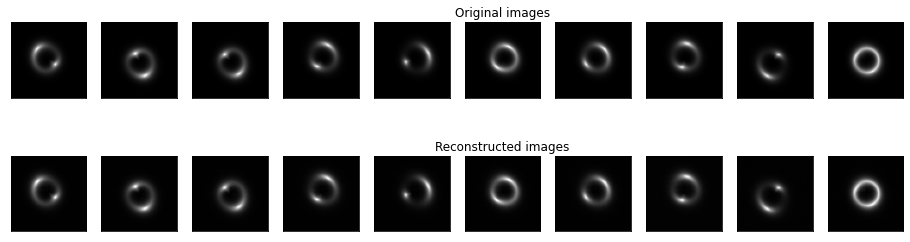

Epoch 152/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 9.86871418717783e-06, Val loss: 7.2016764534055255e-06, 
 Train KLD: 4724126.0, Val KLD: 4379973.0
Epoch 153/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 9.376162779517472e-06, Val loss: 5.8552695918479e-06, 
 Train KLD: 4725946.0, Val KLD: 4333957.5
New lower val loss. Saving model checkpoint!
Epoch 154/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 9.812929420149885e-06, Val loss: 7.549228030256927e-06, 
 Train KLD: 4740183.5, Val KLD: 4362032.5
Epoch 155/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.57410504471045e-05, Val loss: 1.4738106983713806e-05, 
 Train KLD: 4772923.0, Val KLD: 4408265.5
Epoch 156/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.1706390068866313e-05, Val loss: 9.165519259113353e-06, 
 Train KLD: 4783744.0, Val KLD: 4401908.0


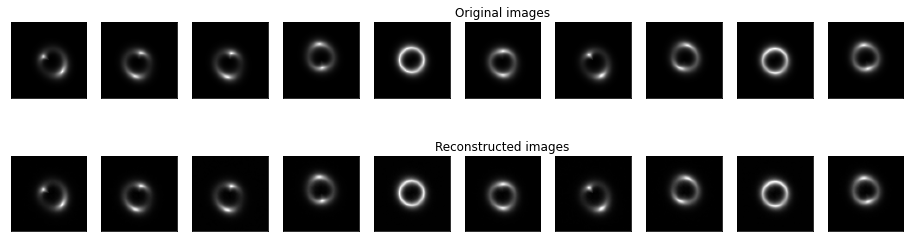

Epoch 157/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.046970828610938e-05, Val loss: 5.803717613162007e-06, 
 Train KLD: 4802103.5, Val KLD: 4398106.0
New lower val loss. Saving model checkpoint!
Epoch 158/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.0502886652830057e-05, Val loss: 5.9330559452064335e-06, 
 Train KLD: 4813140.5, Val KLD: 4471731.5
Epoch 159/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 8.198868272302207e-06, Val loss: 6.797068635933101e-06, 
 Train KLD: 4810315.0, Val KLD: 4434664.0
Epoch 160/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 9.93414141703397e-06, Val loss: 9.430977115698624e-06, 
 Train KLD: 4815925.5, Val KLD: 4396014.0
Epoch 161/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.0778562682389747e-05, Val loss: 6.3629827309341636e-06, 
 Train KLD: 4828942.0, Val KLD: 4397326.5


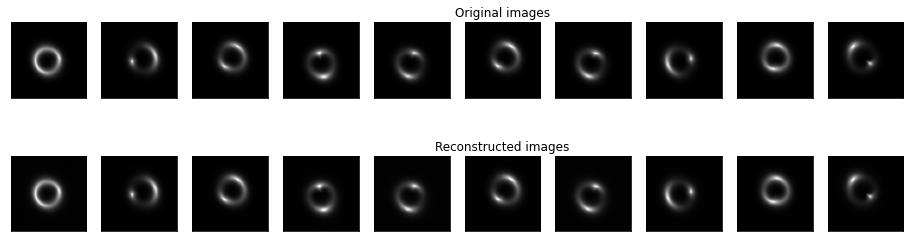

Epoch 162/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 9.857469194685109e-06, Val loss: 5.53459403818124e-06, 
 Train KLD: 4842034.0, Val KLD: 4489855.0
New lower val loss. Saving model checkpoint!
Epoch 163/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 8.841473572829273e-06, Val loss: 8.73721182870213e-06, 
 Train KLD: 4837961.0, Val KLD: 4439647.0
Epoch 164/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.0213679161097389e-05, Val loss: 6.89809121467988e-06, 
 Train KLD: 4842408.5, Val KLD: 4476348.5
Epoch 165/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 1.1166283002239652e-05, Val loss: 7.889083462941926e-06, 
 Train KLD: 4863147.0, Val KLD: 4552458.0
Epoch 166/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 8.495442671119235e-06, Val loss: 5.840349786012666e-06, 
 Train KLD: 4873196.5, Val KLD: 4430837.0


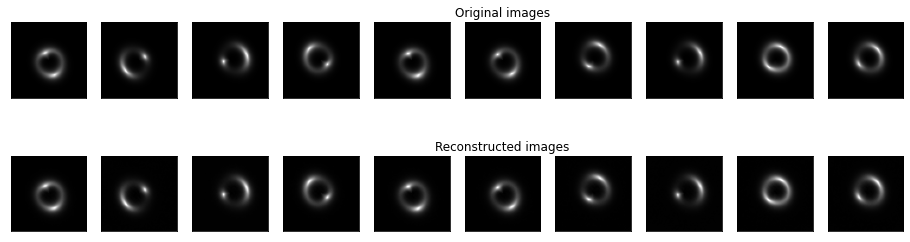

Epoch 167/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 8.838425856083632e-06, Val loss: 8.279934263555333e-06, 
 Train KLD: 4859527.5, Val KLD: 4461406.0
Epoch 168/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 8.200366210076027e-06, Val loss: 6.257555469346698e-06, 
 Train KLD: 4877426.0, Val KLD: 4459056.5
Epoch 169/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 9.288293767895084e-06, Val loss: 6.100631253502797e-06, 
 Train KLD: 4879049.5, Val KLD: 4508178.5
Epoch 170/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 7.382295734714717e-06, Val loss: 3.945864136767341e-06, 
 Train KLD: 4875224.5, Val KLD: 4455389.0
New lower val loss. Saving model checkpoint!
Epoch 171/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 7.571291916974587e-06, Val loss: 4.946228273183806e-06, 
 Train KLD: 4874217.0, Val KLD: 4471652.5


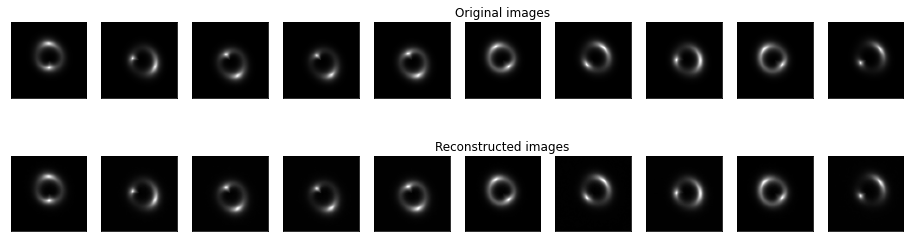

Epoch 172/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 8.717406672076322e-06, Val loss: 4.205483492114581e-06, 
 Train KLD: 4879286.5, Val KLD: 4463182.0
Epoch 173/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 7.423409897455713e-06, Val loss: 7.386900506389793e-06, 
 Train KLD: 4866252.0, Val KLD: 4430332.0
Epoch 174/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 8.241095201810822e-06, Val loss: 5.34966648046975e-06, 
 Train KLD: 4877645.0, Val KLD: 4475197.0
Epoch 175/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 8.468017767881975e-06, Val loss: 4.2223086893500295e-06, 
 Train KLD: 4888033.0, Val KLD: 4465397.0
Epoch 176/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 6.773857421649154e-06, Val loss: 4.535034804575844e-06, 
 Train KLD: 4888145.0, Val KLD: 4467947.5


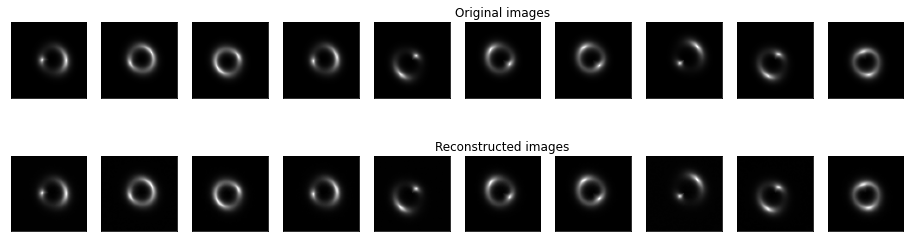

Epoch 177/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 7.222309704957297e-06, Val loss: 4.336892288847594e-06, 
 Train KLD: 4884310.5, Val KLD: 4496719.0
Epoch 178/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 7.577418728033081e-06, Val loss: 5.140042048878968e-06, 
 Train KLD: 4888059.0, Val KLD: 4512794.0
Epoch 179/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 8.255162356363144e-06, Val loss: 6.51654454486561e-06, 
 Train KLD: 4899572.5, Val KLD: 4534396.0
Epoch 180/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 8.346728463948239e-06, Val loss: 5.982361017231597e-06, 
 Train KLD: 4904850.5, Val KLD: 4481738.0
Epoch 181/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 7.377845577138942e-06, Val loss: 4.2509623199293856e-06, 
 Train KLD: 4907185.5, Val KLD: 4474754.0


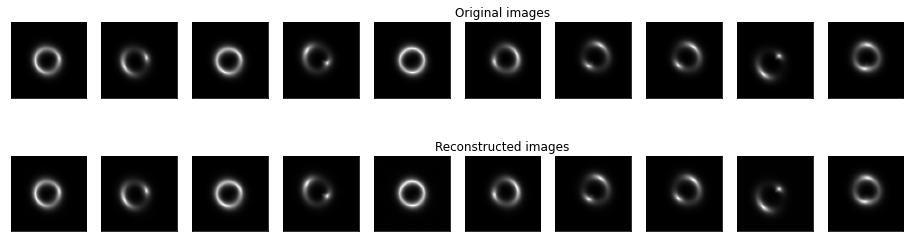

Epoch 182/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 7.059531071718084e-06, Val loss: 6.904177098476794e-06, 
 Train KLD: 4904452.0, Val KLD: 4521498.0
Epoch 183/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 6.8020622165931854e-06, Val loss: 9.558399142406415e-06, 
 Train KLD: 4912758.0, Val KLD: 4492263.5
Epoch 184/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 8.530224476999138e-06, Val loss: 9.708843208500184e-06, 
 Train KLD: 4925379.5, Val KLD: 4762645.0
Epoch 185/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 7.85143674875144e-06, Val loss: 4.88057276015752e-06, 
 Train KLD: 4929557.5, Val KLD: 4529687.0
Epoch 186/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 7.068212653393857e-06, Val loss: 6.6024772422679234e-06, 
 Train KLD: 4926732.5, Val KLD: 4517280.5


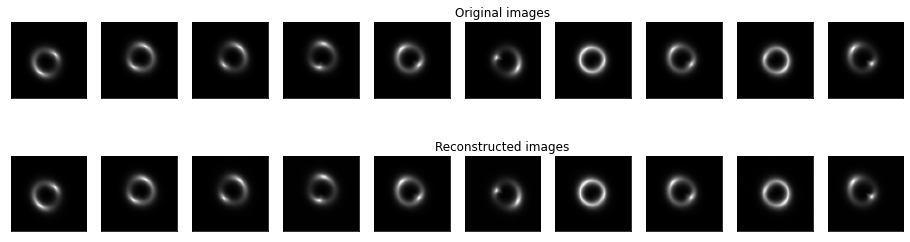

Epoch 187/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 7.29232397134183e-06, Val loss: 4.697346867033048e-06, 
 Train KLD: 4939803.5, Val KLD: 4552814.0
Epoch 188/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 6.715270046697697e-06, Val loss: 4.110527243028628e-06, 
 Train KLD: 4917986.5, Val KLD: 4518174.0
Epoch 189/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 5.915785550314467e-06, Val loss: 4.4537032408698e-06, 
 Train KLD: 4930486.0, Val KLD: 4531679.5
Epoch 190/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 6.235067758098012e-06, Val loss: 6.60568684907048e-06, 
 Train KLD: 4910052.0, Val KLD: 4523452.0
Epoch 191/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 6.867079719086178e-06, Val loss: 3.854993792629102e-06, 
 Train KLD: 4910617.5, Val KLD: 4507965.5
New lower val loss. Saving model checkpoint!


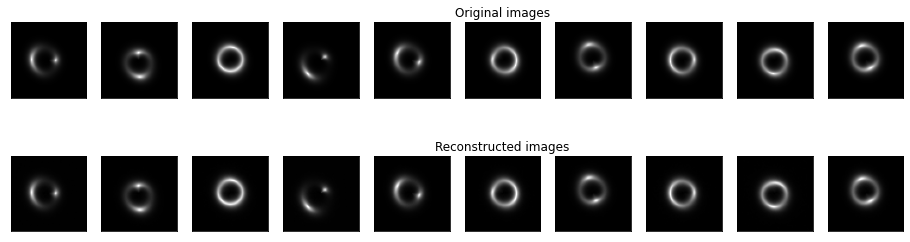

Epoch 192/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 6.031583779986249e-06, Val loss: 3.4888144000433385e-06, 
 Train KLD: 4912839.5, Val KLD: 4589442.5
New lower val loss. Saving model checkpoint!
Epoch 193/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 5.74477644477156e-06, Val loss: 3.3568887829460436e-06, 
 Train KLD: 4908707.0, Val KLD: 4517794.0
New lower val loss. Saving model checkpoint!
Epoch 194/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 5.973454335617134e-06, Val loss: 3.652902250905754e-06, 
 Train KLD: 4914488.5, Val KLD: 4568439.5
Epoch 195/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 6.4628516156517435e-06, Val loss: 5.54236066818703e-06, 
 Train KLD: 4916775.5, Val KLD: 4476237.5
Epoch 196/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 6.888561983942054e-06, Val loss: 6.985152140259743e-06, 
 Train KLD: 4915719.5, Val KLD: 4506446.0


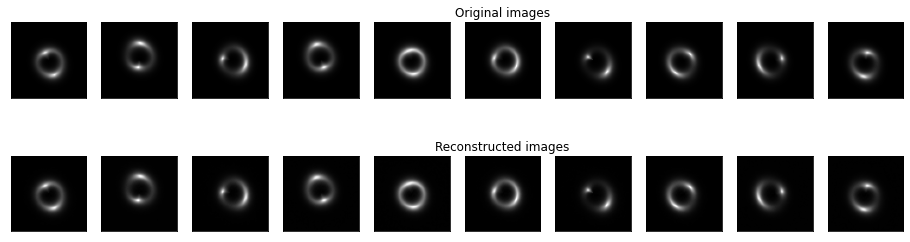

Epoch 197/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 6.0189263422216754e-06, Val loss: 3.715912725965609e-06, 
 Train KLD: 4900109.0, Val KLD: 4495158.5
Epoch 198/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 6.077272246329812e-06, Val loss: 3.4023057651211275e-06, 
 Train KLD: 4908068.5, Val KLD: 4473544.0
Epoch 199/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 6.8412659857131075e-06, Val loss: 4.229988007864449e-06, 
 Train KLD: 4904207.0, Val KLD: 4479296.5
Epoch 200/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 5.8847722357313614e-06, Val loss: 3.7858433188375784e-06, 
 Train KLD: 4907481.0, Val KLD: 4485352.5
Epoch 201/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 5.82047323405277e-06, Val loss: 3.1646097795601236e-06, 
 Train KLD: 4907598.5, Val KLD: 4461794.0
New lower val loss. Saving model checkpoint!


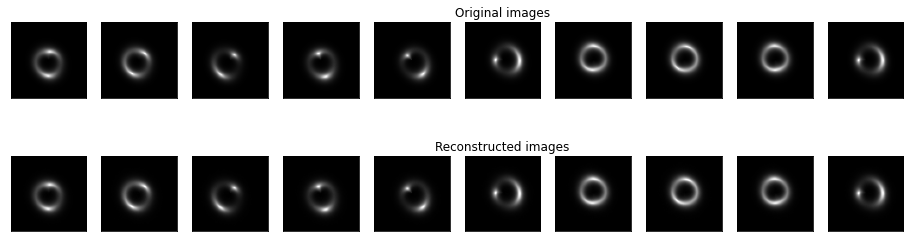

Epoch 202/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 5.5159821386041585e-06, Val loss: 3.0204826089175185e-06, 
 Train KLD: 4919561.0, Val KLD: 4505705.5
New lower val loss. Saving model checkpoint!
Epoch 203/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 5.284501639835071e-06, Val loss: 2.8321089757810114e-06, 
 Train KLD: 4903178.0, Val KLD: 4495325.0
New lower val loss. Saving model checkpoint!
Epoch 204/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 5.921032879996346e-06, Val loss: 3.1710560506326146e-06, 
 Train KLD: 4914696.0, Val KLD: 4512067.5
Epoch 205/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 5.556526957661845e-06, Val loss: 3.4076556403306313e-06, 
 Train KLD: 4904748.5, Val KLD: 4500882.5
Epoch 206/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 6.083487278374378e-06, Val loss: 3.531747779561556e-06, 
 Train KLD: 4910372.0, Val KLD: 4534675.0


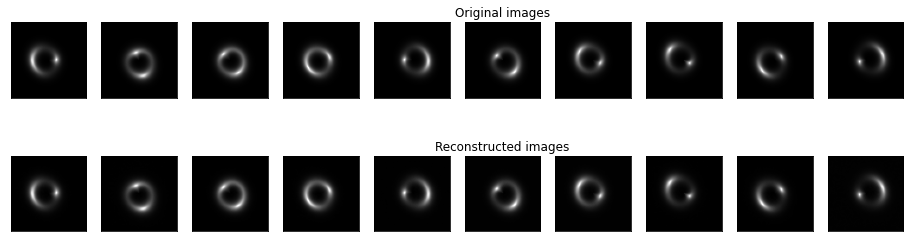

Epoch 207/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 5.056137979408959e-06, Val loss: 3.087024424530682e-06, 
 Train KLD: 4913038.0, Val KLD: 4467149.5
Epoch 208/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 5.755834081355715e-06, Val loss: 3.453809313214151e-06, 
 Train KLD: 4901351.5, Val KLD: 4470488.5
Epoch 209/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 5.214007160248002e-06, Val loss: 3.176658537995536e-06, 
 Train KLD: 4897692.0, Val KLD: 4479573.0
Epoch 210/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 6.033383215253707e-06, Val loss: 3.020491476490861e-06, 
 Train KLD: 4903935.0, Val KLD: 4484710.0
Epoch 211/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 5.370473900256911e-06, Val loss: 5.746571332565509e-06, 
 Train KLD: 4901385.5, Val KLD: 4507003.5


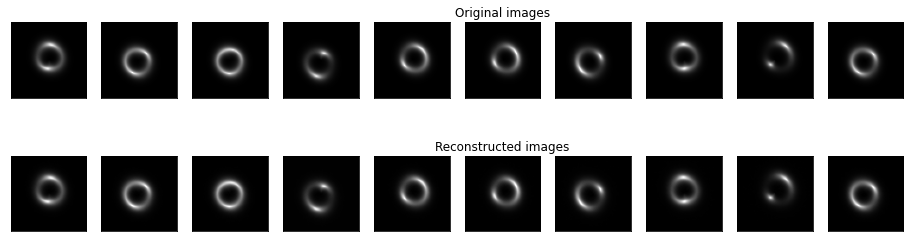

Epoch 212/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 5.087010777060641e-06, Val loss: 2.9068651201669127e-06, 
 Train KLD: 4897558.5, Val KLD: 4476435.0
Epoch 213/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 5.1060737860098016e-06, Val loss: 3.1868539736024104e-06, 
 Train KLD: 4902737.0, Val KLD: 4512488.0
Epoch 214/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 5.376114586397307e-06, Val loss: 2.5976016786444234e-06, 
 Train KLD: 4900105.0, Val KLD: 4502280.0
New lower val loss. Saving model checkpoint!
Epoch 215/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 4.889662250207039e-06, Val loss: 2.7462247089715675e-06, 
 Train KLD: 4900435.5, Val KLD: 4473186.5
Epoch 216/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 4.6380605454032775e-06, Val loss: 2.7576638785831165e-06, 
 Train KLD: 4898018.5, Val KLD: 4493973.5


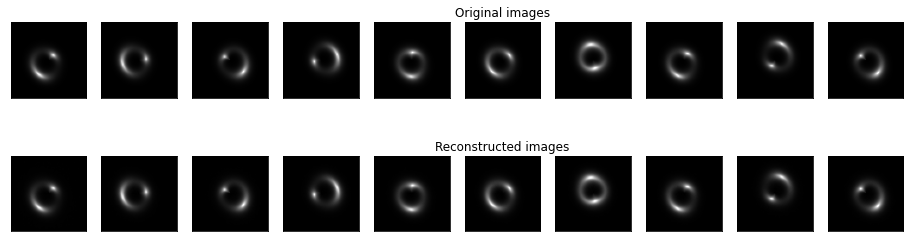

Epoch 217/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 5.154840891918866e-06, Val loss: 3.991308403783478e-06, 
 Train KLD: 4890654.0, Val KLD: 4453877.5
Epoch 218/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 5.2390023483894765e-06, Val loss: 2.6435327526996844e-06, 
 Train KLD: 4897272.0, Val KLD: 4519253.0
Epoch 219/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 4.460071068024263e-06, Val loss: 3.414335196794127e-06, 
 Train KLD: 4893058.5, Val KLD: 4500851.0
Epoch 220/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 5.1356814765313175e-06, Val loss: 4.6510017455148045e-06, 
 Train KLD: 4893707.5, Val KLD: 4533011.0
Epoch 221/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 4.924278528051218e-06, Val loss: 3.4014208267763024e-06, 
 Train KLD: 4900532.0, Val KLD: 4470248.0


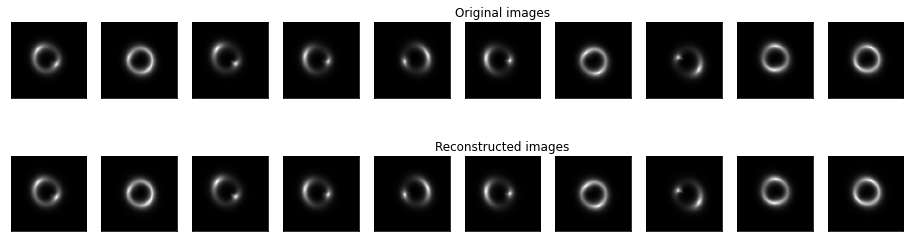

Epoch 222/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 4.710922894446412e-06, Val loss: 2.7623802907328354e-06, 
 Train KLD: 4895008.5, Val KLD: 4518465.0
Epoch 223/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 4.587041530612623e-06, Val loss: 3.5995299185742624e-06, 
 Train KLD: 4894389.5, Val KLD: 4481957.0
Epoch 224/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 4.306721166358329e-06, Val loss: 2.690071596589405e-06, 
 Train KLD: 4896869.5, Val KLD: 4462353.5
Epoch 225/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 4.481426003621891e-06, Val loss: 2.9272732717799954e-06, 
 Train KLD: 4893214.0, Val KLD: 4507598.0
Epoch 226/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 4.878742402070202e-06, Val loss: 2.5358021957799792e-06, 
 Train KLD: 4886753.0, Val KLD: 4471892.0
New lower val loss. Saving model checkpoint!


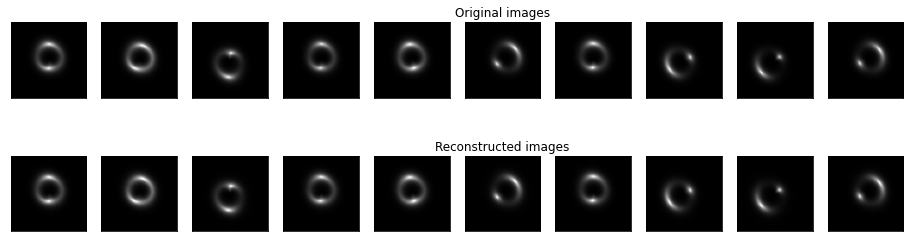

Epoch 227/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 4.958597401127918e-06, Val loss: 3.0399910428968724e-06, 
 Train KLD: 4885144.5, Val KLD: 4497901.5
Epoch 228/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 4.47533602709882e-06, Val loss: 2.572419361968059e-06, 
 Train KLD: 4889166.5, Val KLD: 4428475.5
Epoch 229/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 4.186852947896114e-06, Val loss: 2.3469224288419355e-06, 
 Train KLD: 4886656.5, Val KLD: 4468161.0
New lower val loss. Saving model checkpoint!
Epoch 230/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 4.180169980827486e-06, Val loss: 3.1035285701364046e-06, 
 Train KLD: 4885161.0, Val KLD: 4498599.0
Epoch 231/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 4.457463091966929e-06, Val loss: 2.416252755210735e-06, 
 Train KLD: 4884193.0, Val KLD: 4476279.5


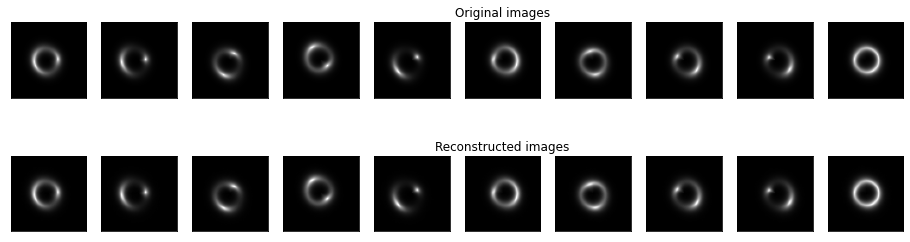

Epoch 232/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 4.398385954118567e-06, Val loss: 5.202907232160214e-06, 
 Train KLD: 4882736.0, Val KLD: 4516783.0
Epoch 233/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 4.5471638259186875e-06, Val loss: 2.4111484435707098e-06, 
 Train KLD: 4880448.5, Val KLD: 4456405.5
Epoch 234/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 4.167532551946351e-06, Val loss: 2.335861609026324e-06, 
 Train KLD: 4887752.5, Val KLD: 4470047.5
New lower val loss. Saving model checkpoint!
Epoch 235/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 4.6045201997912955e-06, Val loss: 3.6512869883154053e-06, 
 Train KLD: 4879093.0, Val KLD: 4492018.0
Epoch 236/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 4.33360219176393e-06, Val loss: 3.794815711444244e-06, 
 Train KLD: 4877456.5, Val KLD: 4467892.0


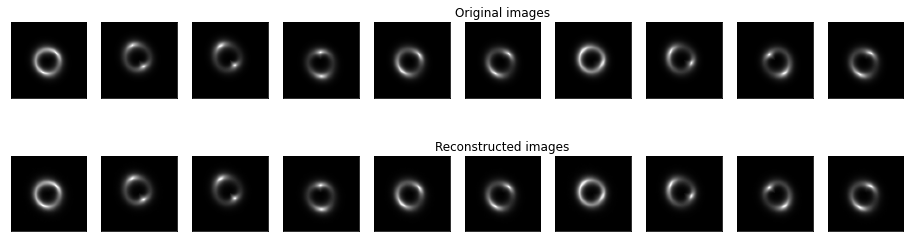

Epoch 237/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 4.77055709779961e-06, Val loss: 2.2529904981638538e-06, 
 Train KLD: 4867826.5, Val KLD: 4465246.0
New lower val loss. Saving model checkpoint!
Epoch 238/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 4.388505658425856e-06, Val loss: 2.262248017359525e-06, 
 Train KLD: 4871083.5, Val KLD: 4447994.0
Epoch 239/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 4.3481954890012275e-06, Val loss: 2.078923216686235e-06, 
 Train KLD: 4877514.5, Val KLD: 4474415.5
New lower val loss. Saving model checkpoint!
Epoch 240/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.9376063796225935e-06, Val loss: 2.255847903143149e-06, 
 Train KLD: 4877193.0, Val KLD: 4467349.0
Epoch 241/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 4.056631951243617e-06, Val loss: 2.2032027118257247e-06, 
 Train KLD: 4873415.0, Val KLD: 4463660.0


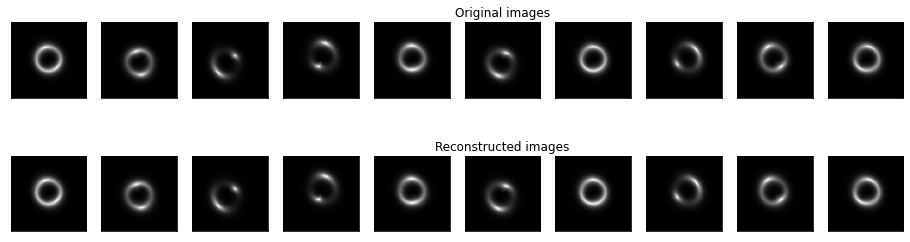

Epoch 242/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 4.192992946627783e-06, Val loss: 2.3068912469170755e-06, 
 Train KLD: 4879551.5, Val KLD: 4463181.0
Epoch 243/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 4.139972588745877e-06, Val loss: 2.263069291075226e-06, 
 Train KLD: 4871354.5, Val KLD: 4493480.5
Epoch 244/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.7969602999510244e-06, Val loss: 2.06544450520596e-06, 
 Train KLD: 4875998.0, Val KLD: 4447670.0
New lower val loss. Saving model checkpoint!
Epoch 245/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 4.029236606584163e-06, Val loss: 2.1457337879837723e-06, 
 Train KLD: 4879815.5, Val KLD: 4443512.0
Epoch 246/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 4.436493327375501e-06, Val loss: 3.0259329832915682e-06, 
 Train KLD: 4876178.5, Val KLD: 4467385.0


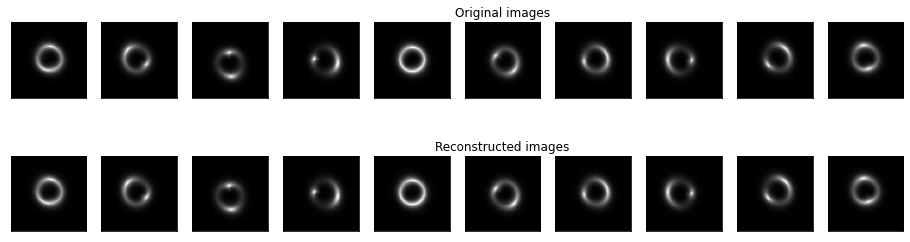

Epoch 247/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.891325832228176e-06, Val loss: 2.0113247956032865e-06, 
 Train KLD: 4872979.0, Val KLD: 4462090.0
New lower val loss. Saving model checkpoint!
Epoch 248/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.804848802246852e-06, Val loss: 2.204825023000012e-06, 
 Train KLD: 4880122.5, Val KLD: 4458559.0
Epoch 249/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.859699972963426e-06, Val loss: 1.970207904378185e-06, 
 Train KLD: 4875359.5, Val KLD: 4440865.5
New lower val loss. Saving model checkpoint!
Epoch 250/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.982482667197473e-06, Val loss: 2.466283149260562e-06, 
 Train KLD: 4875604.0, Val KLD: 4476829.5
Epoch 251/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.962991740991129e-06, Val loss: 2.4097616915241815e-06, 
 Train KLD: 4874929.0, Val KLD: 4482170.0


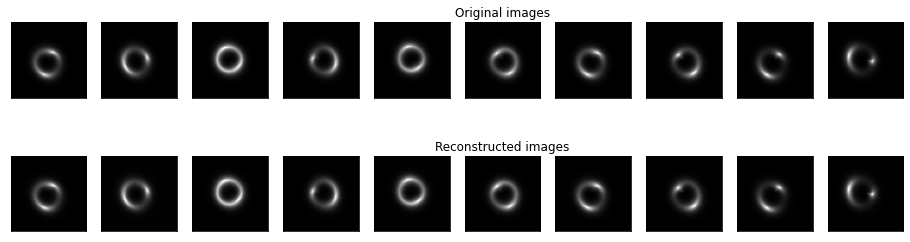

Epoch 252/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.874740741593996e-06, Val loss: 2.1585797185252886e-06, 
 Train KLD: 4870912.5, Val KLD: 4435811.0
Epoch 253/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.76346747543721e-06, Val loss: 1.9506110220390838e-06, 
 Train KLD: 4873638.5, Val KLD: 4458118.5
New lower val loss. Saving model checkpoint!
Epoch 254/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.7885672554693883e-06, Val loss: 2.3155216695158742e-06, 
 Train KLD: 4875211.0, Val KLD: 4502342.5
Epoch 255/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.7065376545797335e-06, Val loss: 1.8492187336960342e-06, 
 Train KLD: 4878328.0, Val KLD: 4490034.0
New lower val loss. Saving model checkpoint!
Epoch 256/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.56062355422182e-06, Val loss: 1.99851979232335e-06, 
 Train KLD: 4876619.5, Val KLD: 4475371.5


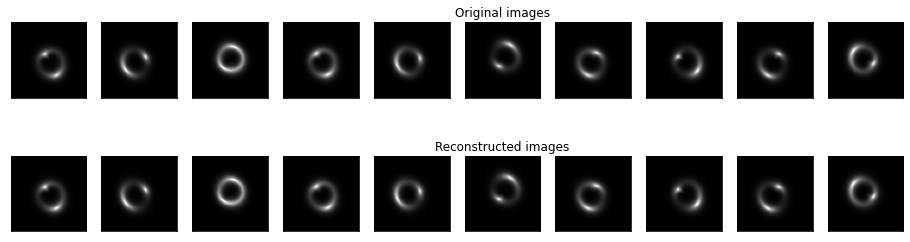

Epoch 257/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.6536346215143567e-06, Val loss: 2.302684379174025e-06, 
 Train KLD: 4877393.5, Val KLD: 4450995.5
Epoch 258/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.7811078072991222e-06, Val loss: 2.1553148599195993e-06, 
 Train KLD: 4873139.0, Val KLD: 4511823.0
Epoch 259/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.895429472322576e-06, Val loss: 2.4046867110882886e-06, 
 Train KLD: 4869256.0, Val KLD: 4494452.5
Epoch 260/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.741061163964332e-06, Val loss: 1.8128968122255174e-06, 
 Train KLD: 4872417.0, Val KLD: 4481476.0
New lower val loss. Saving model checkpoint!
Epoch 261/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.602389142542961e-06, Val loss: 1.8240456256535253e-06, 
 Train KLD: 4874090.5, Val KLD: 4460409.0


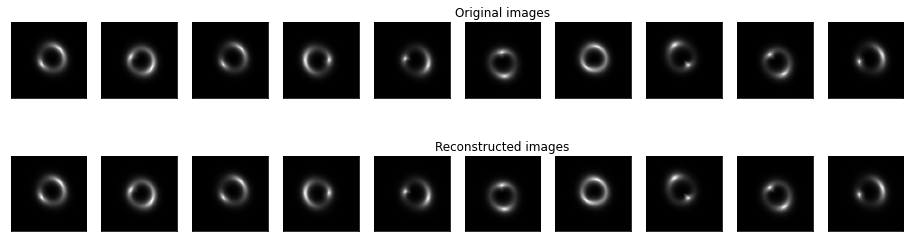

Epoch 262/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.5907737583329435e-06, Val loss: 2.19060120798531e-06, 
 Train KLD: 4874484.5, Val KLD: 4463006.0
Epoch 263/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.620283223426668e-06, Val loss: 1.7975085029320326e-06, 
 Train KLD: 4872642.0, Val KLD: 4443607.0
New lower val loss. Saving model checkpoint!
Epoch 264/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.626597163020051e-06, Val loss: 2.153668447135715e-06, 
 Train KLD: 4872387.5, Val KLD: 4469354.0
Epoch 265/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.6615986118704313e-06, Val loss: 2.041924972218112e-06, 
 Train KLD: 4874648.0, Val KLD: 4454051.0
Epoch 266/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.637070221884642e-06, Val loss: 1.8117248146154452e-06, 
 Train KLD: 4876322.0, Val KLD: 4479914.0


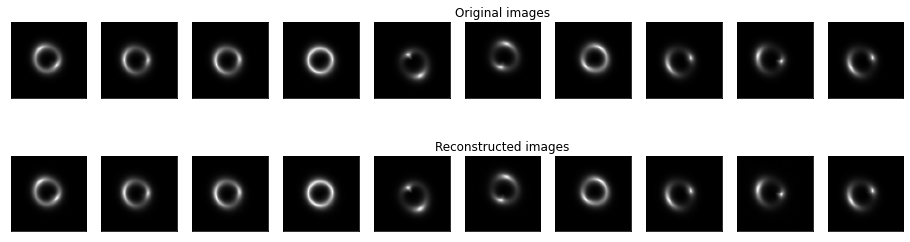

Epoch 267/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.4663321457628626e-06, Val loss: 1.7773830904843635e-06, 
 Train KLD: 4873604.5, Val KLD: 4473356.5
New lower val loss. Saving model checkpoint!
Epoch 268/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.5171585750504164e-06, Val loss: 1.7788760260373238e-06, 
 Train KLD: 4873188.5, Val KLD: 4486012.5
Epoch 269/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.553061105776578e-06, Val loss: 1.868007984739961e-06, 
 Train KLD: 4873029.5, Val KLD: 4465175.5
Epoch 270/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.4672461879381444e-06, Val loss: 1.784643473001779e-06, 
 Train KLD: 4872171.0, Val KLD: 4470860.0
Epoch 271/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.4886118100985186e-06, Val loss: 1.7487899413026753e-06, 
 Train KLD: 4873333.0, Val KLD: 4480781.0
New lower val loss. Saving model checkpoint!


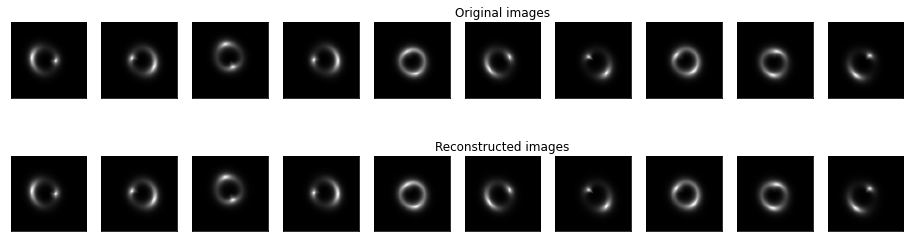

Epoch 272/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.454833176874672e-06, Val loss: 2.038409320448409e-06, 
 Train KLD: 4877673.0, Val KLD: 4484515.5
Epoch 273/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.45175408256182e-06, Val loss: 1.726604750729166e-06, 
 Train KLD: 4876541.5, Val KLD: 4480207.0
New lower val loss. Saving model checkpoint!
Epoch 274/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.4602135201566853e-06, Val loss: 1.7981546989176422e-06, 
 Train KLD: 4875727.5, Val KLD: 4499407.0
Epoch 275/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.4434090139257023e-06, Val loss: 1.7432762433600146e-06, 
 Train KLD: 4875874.5, Val KLD: 4491946.0
Epoch 276/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.58374131792516e-06, Val loss: 1.730174403746787e-06, 
 Train KLD: 4877577.0, Val KLD: 4482354.5


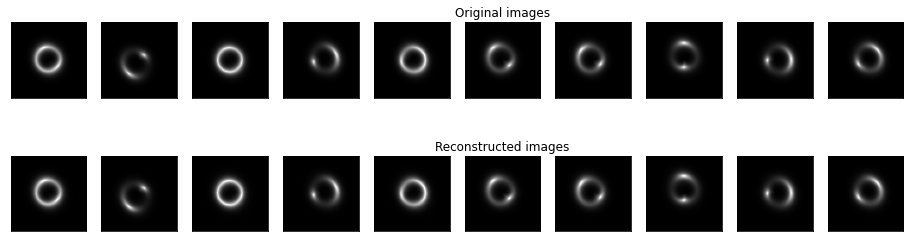

Epoch 277/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.389973244338762e-06, Val loss: 1.7041408000295633e-06, 
 Train KLD: 4876309.0, Val KLD: 4485156.0
New lower val loss. Saving model checkpoint!
Epoch 278/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.437412033235887e-06, Val loss: 1.7614594298720476e-06, 
 Train KLD: 4878033.5, Val KLD: 4473466.5
Epoch 279/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.334597067805589e-06, Val loss: 1.681064077274641e-06, 
 Train KLD: 4876521.5, Val KLD: 4471202.0
New lower val loss. Saving model checkpoint!
Epoch 280/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.3412572975066723e-06, Val loss: 1.718338239697914e-06, 
 Train KLD: 4876251.0, Val KLD: 4465264.5
Epoch 281/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.3730109407770215e-06, Val loss: 1.6879957911442034e-06, 
 Train KLD: 4875334.0, Val KLD: 4467119.5


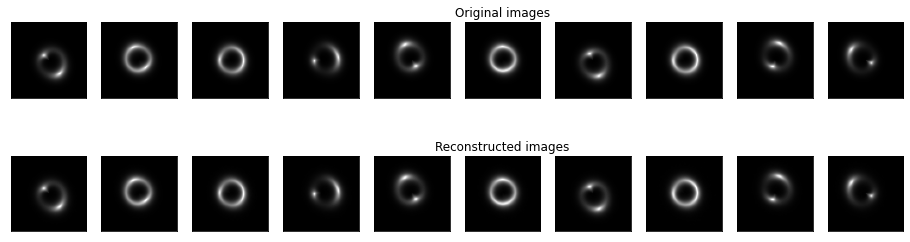

Epoch 282/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.3857691050798167e-06, Val loss: 1.667598553467542e-06, 
 Train KLD: 4877410.5, Val KLD: 4459118.0
New lower val loss. Saving model checkpoint!
Epoch 283/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.34888432007574e-06, Val loss: 1.6887838683032896e-06, 
 Train KLD: 4877409.0, Val KLD: 4482565.5
Epoch 284/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.3436269859521417e-06, Val loss: 1.6906041082620504e-06, 
 Train KLD: 4876548.5, Val KLD: 4477975.0
Epoch 285/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.363133600942092e-06, Val loss: 1.6723174667276908e-06, 
 Train KLD: 4878250.5, Val KLD: 4490256.5
Epoch 286/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.2874918360903393e-06, Val loss: 1.6595301985944388e-06, 
 Train KLD: 4877611.0, Val KLD: 4471797.5
New lower val loss. Saving model checkpoint!


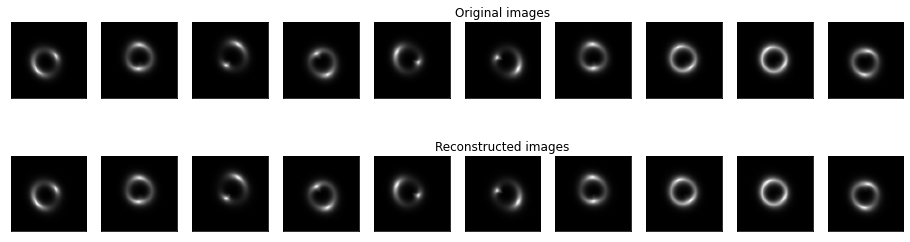

Epoch 287/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.267582087573828e-06, Val loss: 1.6592551901339903e-06, 
 Train KLD: 4876657.0, Val KLD: 4471618.0
New lower val loss. Saving model checkpoint!
Epoch 288/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.298599494883092e-06, Val loss: 1.661133069319476e-06, 
 Train KLD: 4875385.0, Val KLD: 4485350.0
Epoch 289/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.3244107271457324e-06, Val loss: 1.65095616466715e-06, 
 Train KLD: 4878064.5, Val KLD: 4473967.0
New lower val loss. Saving model checkpoint!
Epoch 290/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.306691951365792e-06, Val loss: 1.6623629335299484e-06, 
 Train KLD: 4879207.5, Val KLD: 4472280.0
Epoch 291/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.2786767860670807e-06, Val loss: 1.6503462347827735e-06, 
 Train KLD: 4877581.0, Val KLD: 4464732.5
New lower val loss. Saving model checkpoint!


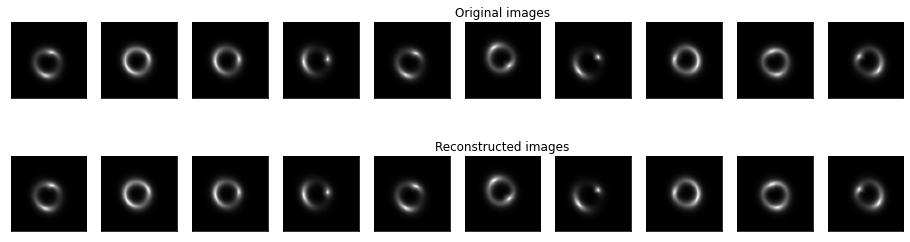

Epoch 292/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.3040282687579747e-06, Val loss: 1.653275376156671e-06, 
 Train KLD: 4877658.0, Val KLD: 4486634.0
Epoch 293/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.2829700558068e-06, Val loss: 1.6557429489694186e-06, 
 Train KLD: 4879679.0, Val KLD: 4474137.0
Epoch 294/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.2837854178069392e-06, Val loss: 1.644337544348673e-06, 
 Train KLD: 4876988.0, Val KLD: 4475505.5
New lower val loss. Saving model checkpoint!
Epoch 295/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.303325001979829e-06, Val loss: 1.6442484138678992e-06, 
 Train KLD: 4880309.0, Val KLD: 4485075.5
New lower val loss. Saving model checkpoint!
Epoch 296/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.296306886113598e-06, Val loss: 1.649931164138252e-06, 
 Train KLD: 4877931.5, Val KLD: 4478699.5


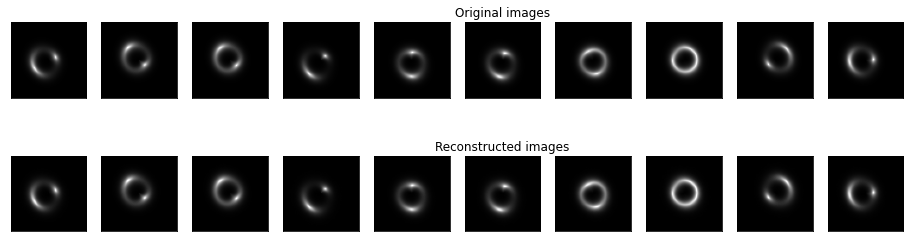

Epoch 297/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.2857403766684e-06, Val loss: 1.6547660379728768e-06, 
 Train KLD: 4879713.0, Val KLD: 4458183.0
Epoch 298/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.2616244425298646e-06, Val loss: 1.640502432564972e-06, 
 Train KLD: 4879471.5, Val KLD: 4472747.0
New lower val loss. Saving model checkpoint!
Epoch 299/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.2975074191199383e-06, Val loss: 1.648100806050934e-06, 
 Train KLD: 4878483.5, Val KLD: 4466087.5
Epoch 300/300:


  0%|          | 0/109 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

Train loss: 3.262330437792116e-06, Val loss: 1.6507596001247293e-06, 
 Train KLD: 4877740.5, Val KLD: 4462622.0


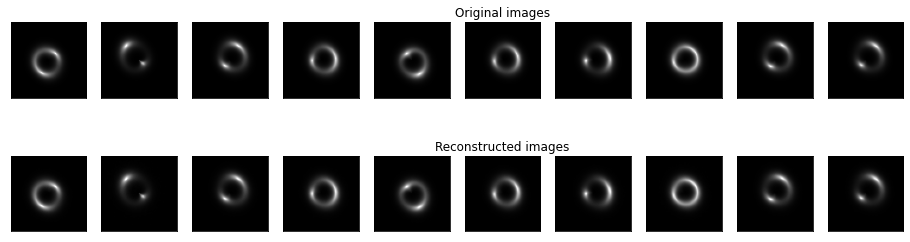

In [26]:
#Training and tracking model
PATH = "conv_VAE.pth"
model, loss_dict = fit_model(model, config, checkpoint_path = "conv_VAE.pth")

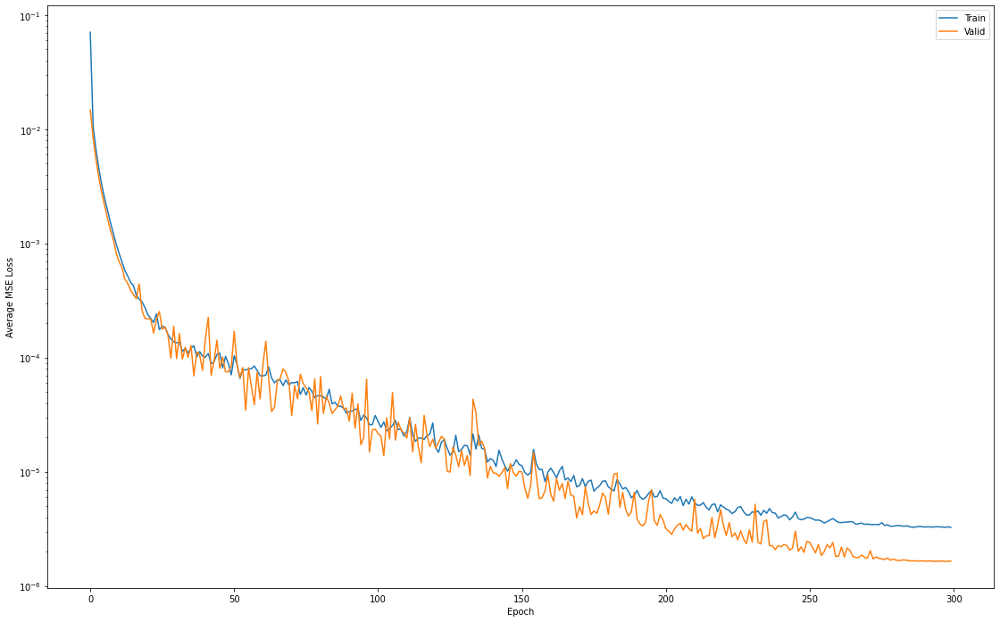

In [27]:
# Plot losses
plt.figure(figsize=(19,12))
plt.semilogy(loss_dict['train_loss'], label='Train')
plt.semilogy(loss_dict['val_loss'], label='Valid')
plt.xlabel('Epoch')
plt.ylabel('Average MSE Loss')
#plt.grid()
plt.legend()
#plt.title('loss')


plot_name = "Loss_history"
plt.savefig(plot_name, format="png", dpi=80)  
pic = Image.open(plot_name)
wandb.log({plot_name: [wandb.Image(pic, caption = f"Train, Val MSE loss history")]})

plt.show()

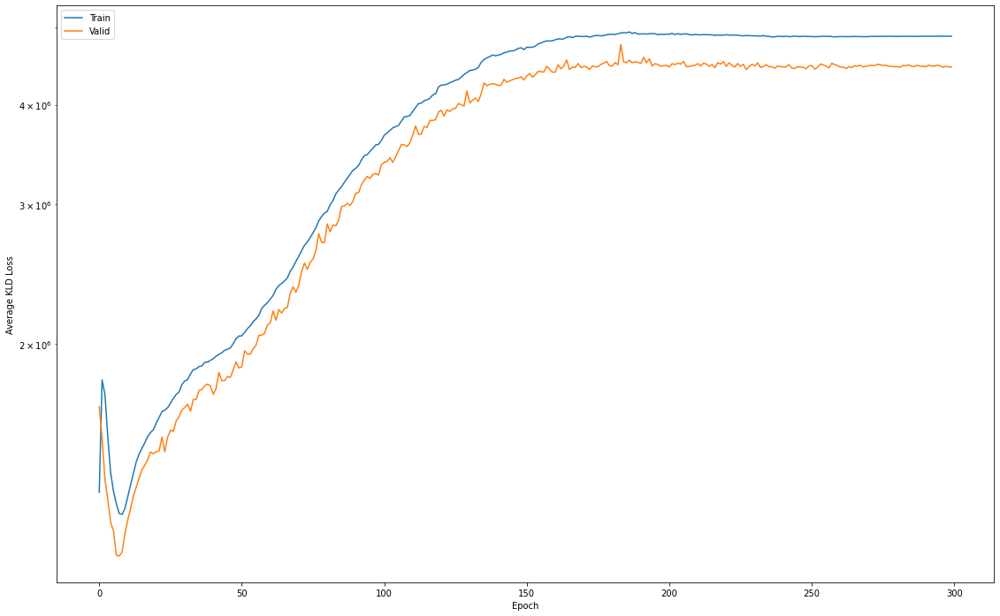

In [28]:
# Plot losses
plt.figure(figsize=(19,12))
plt.semilogy(loss_dict['train_kld_loss'], label='Train')
plt.semilogy(loss_dict['val_kld_loss'], label='Valid')
plt.xlabel('Epoch')
plt.ylabel('Average KLD Loss')
#plt.grid()
plt.legend()
#plt.title('loss')


plot_name = "KLD_Loss_history"
plt.savefig(plot_name, format="png", dpi=80)  
pic = Image.open(plot_name)
wandb.log({plot_name: [wandb.Image(pic, caption = f"Train, Val KLD loss history")]})

plt.show()

In [29]:
del encoder, decoder, model
gc.collect()

encoder = Encoder().to(device)
decoder = Decoder().to(device)

model = VAE(encoder, decoder).to(device)
model.load_state_dict(torch.load(PATH))

<All keys matched successfully>

In [30]:
criterion = nn.MSELoss()

_, _, train_mse, train_kld = test_epoch(model, train_loader, criterion)
print("Train set MSE:" + str(train_mse))
print("Train set KLD:" + str(train_kld))

_, _, val_mse, val_kld = test_epoch(model, val_loader, criterion)
print("Val set MSE:" + str(val_mse))
print("Val set KLD:" + str(val_kld))

_, _, test_mse, test_kld = test_epoch(model, test_loader, criterion)
print("Test set MSE:" + str(test_mse))
print("Test set KLD:" + str(test_kld))

  0%|          | 0/109 [00:00<?, ?it/s]

Train set MSE:3.0794613e-06
Train set KLD:4874510.0


  0%|          | 0/9 [00:00<?, ?it/s]

Val set MSE:1.6405116e-06
Val set KLD:4472747.0


  0%|          | 0/20 [00:00<?, ?it/s]

Test set MSE:1.6421507e-06
Test set KLD:4793729.0


In [31]:
MSE_scores = [[train_mse, val_mse, test_mse]]
KLD_scores = [[train_kld, val_kld, test_kld]]

wandb.log({"MSE_Scores": wandb.Table(data = MSE_scores, columns=["Train_MSE", "Val_MSE", "Test_MSE"])})
wandb.log({"KLD_Scores": wandb.Table(data = KLD_scores, columns=["Train_KLD", "Val_KLD", "Test_KLD"])})

## Model Testing for Anomaly Detection

In [32]:
def img_paths_list(root_dir):
    root_list = glob.glob(root_dir)
    class_map = {}
    class_distribution = {}
    
    for img_path in root_list:
        class_name = img_path.split(os.sep)[-2]
        if class_name not in class_distribution:
            class_distribution[class_name] = 1
        else:
            class_distribution[class_name] +=1
                
    for index, entity in enumerate(class_distribution):
        class_map[entity] = index
    print("Dataset Distribution:\n")
    print(class_distribution)
    print("\n\nClass indices:\n")
    print(class_map)

    data = []
    for img_path in tqdm(root_list):
        class_name = img_path.split(os.sep)[-2]
        data.append([img_path, class_name])
        
    return data, class_map

In [33]:
class CustomDataset(Dataset):
    def __init__(self, img_paths_and_labels_list, class_map,transform = None):
        self.data = img_paths_and_labels_list
        self.class_map = class_map
        self.transform = transform
            
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, idx):
        img_path, class_name = self.data[idx]
        img = np.load(img_path, allow_pickle = True)
        if class_name == 'axion':
            img = img[0]
        img = (img - np.min(img))/(np.max(img) - np.min(img))
        
        if self.transform:
            aug = self.transform(image=img)
            img = aug['image']
        
        img = img.to(torch.float)
        class_id = self.class_map[class_name]
        class_id = torch.tensor(class_id)

        return img, class_id

In [34]:
full_test_data_root_dir = r'../input/gsocml4scimodel3test/Model_III_test/*/*'
full_test_dataset_img_paths_list, class_map = img_paths_list(full_test_data_root_dir)

Dataset Distribution:

{'axion': 5000, 'no_sub': 5000, 'cdm': 5000}


Class indices:

{'axion': 0, 'no_sub': 1, 'cdm': 2}


  0%|          | 0/15000 [00:00<?, ?it/s]

In [35]:
full_test_dataset = CustomDataset(full_test_dataset_img_paths_list, class_map, transform = test_transforms)
print(len(full_test_dataset))

15000


In [36]:
full_test_loader = DataLoader(full_test_dataset, batch_size = config["batch_size"], shuffle = False, num_workers = 2)
single_batch = next(iter(test_loader))
single_batch[0].shape

torch.Size([1, 64, 64])

In [37]:
def final_test_epoch(model, dataloader,criterion):

    model.eval()
    losses = []
    
    truth_list = []

    with torch.no_grad():

        loop=tqdm(enumerate(dataloader),total=len(dataloader))
        
        for batch_idx, (img_batch, class_ids) in loop:
            
            for img, class_id in zip(img_batch,class_ids):
                
                if class_id == class_map['no_sub']:
                    truth_list.append(0)
                else:
                    truth_list.append(1)
                    
                img = img.unsqueeze(0)
                X = img.to(device)
                recon, _, _ = model(X)
                loss = criterion(recon, X)
                losses.append(loss.detach().cpu().numpy())
                   

            
    return np.asarray(losses), np.asarray(truth_list), np.mean(losses)

In [38]:
criterion = nn.MSELoss()
loss_list, truth_list, mean_loss = final_test_epoch(model, full_test_loader,criterion)
print(mean_loss)

  0%|          | 0/59 [00:00<?, ?it/s]

2.9192945e-05


In [39]:
fpr, tpr, thresholds = roc_curve(truth_list, loss_list)
roc_auc = auc(fpr, tpr)

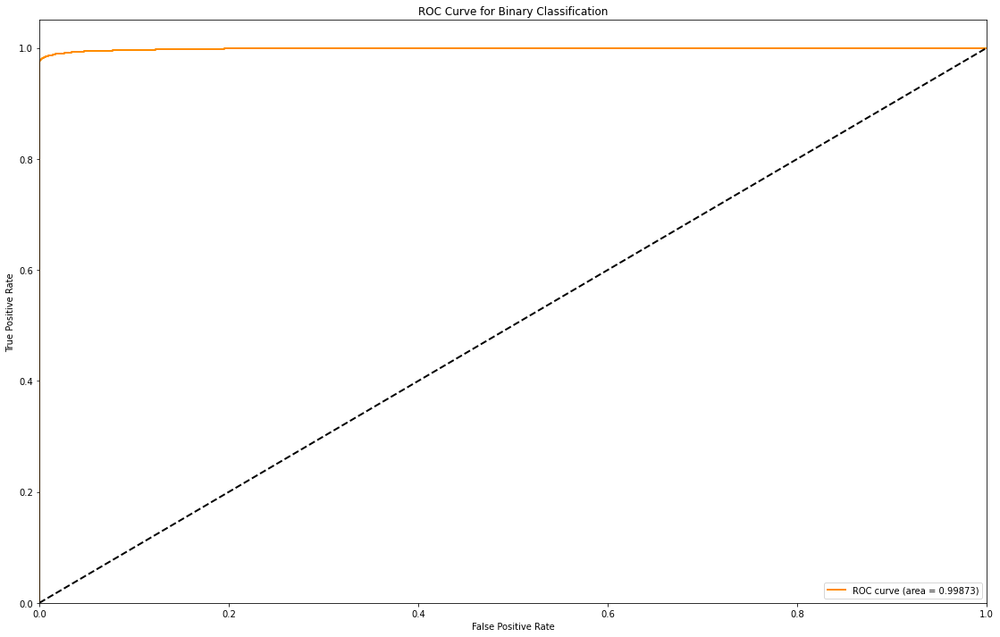

In [40]:
# Plot the AUC
plt.figure(figsize = (19, 12))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.5f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Binary Classification')
plt.legend(loc="lower right", prop={"size":10})

plot_name = "ROC-AUC"
plt.savefig(plot_name, format="png", dpi=80)  
pic = Image.open(plot_name)
wandb.log({plot_name: [wandb.Image(pic, caption = f"ROC-AUC curve")]})

plt.show()

In [41]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
train_kld_loss,▂▁▁▂▂▂▂▃▃▄▄▅▅▆▆▆▇▇▇█████████████████████
train_loss,█▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_kld_loss,▁▁▂▂▂▂▂▃▃▄▄▄▅▅▆▆▆▇▇▇▇▇▇▇██▇▇▇▇▇▇▇▇▇▇▇▇▇▇
val_loss,█▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,300
train_kld_loss,4877740.5
train_loss,0.0
val_kld_loss,4462622.0
val_loss,0.0
